In [37]:
## fonctions de base

#packages

using Pkg
#Pkg.add("LinearAlgebra")
#Pkg.add("LinearSolve")
#Pkg.add("Plots")
#Pkg.add("Printf")
#Pkg.add("LaTeXStrings")
#Pkg.add("Interpolations")
#Pkg.add("NPZ")


using LinearAlgebra
using LinearSolve
using Plots
using LaTeXStrings
using Interpolations
using NPZ
using Printf


#-------------------------------------------------------------------------------------
#	dressing of function f (given as array f_discr, occupation ratio given as n_discr)
#-------------------------------------------------------------------------------------


function f_varphimat(lam_discr,gb)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function f_dlam(lam_discr)
    L = size(lam_discr)[1]
    dlam = zeros(L)
    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    return dlam
end
    
function dress(gb, lam_discr, n_discr, f_discr)
    
    
    varphimat = f_varphimat(lam_discr,gb)
    dlam = f_dlam(lam_discr)
    
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    A\f_discr
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    0.5/pi * dot(dlam , Diagonal(n_discr) * (A \ f_discr) )
end

#-------------------------------------------------------------------------
#	solve Yang-Yang equation
#-------------------------------------------------------------------------

function fun1(z)
    if z>0
        return log(1. +exp(-z))
    else
        return log(1. +exp(z)) - z
    end
end

function fun2(z)
    if z<0
        return 1. /(1. +exp(z))
    else
        return exp(-z)/(1. +exp(-z))
    end
end

function yangyang(gb, beta, lam_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])

    bare_E = 0.5 * beta[3] * lam_discr.^2 + beta[2] * lam_discr + beta[1] * ones(L)
    eps = copy(bare_E)
    n = fun2.(eps)

    #iterative solution
    diff = 1.
    while diff>1e-12
        old_n = copy(n)
        eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
        n = fun2.(eps)
        diff = norm(n-old_n)
    end
    eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
    n = fun2.(eps)
    return n
end

#-------------------------------------------------------------------------------------
#	compute effective velocity
#-------------------------------------------------------------------------------------

function veff(gb, lam_discr, n_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    dresser = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    onedr = dresser\ones(L)
    iddr = dresser\copy(lam_discr)
    iddr ./ onedr
end

#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x1)[1]
    
    veff1 = zeros(L)
    veff2 = zeros(L)
    #println(@sprintf "size x2 = %.3f , size theta_tab  = %.3f " size(x1)[1] size(theta_tab)[1])
    #display(x2)
    #display(theta_tab)
    f2 = linear_interpolation(x2, theta_tab)
    f1 = linear_interpolation(x1, theta_tab)
    
    f2 = interpolate((x2,), theta_tab, Gridded(Linear()))
    f2 = extrapolate(f2, Linear()) 
    
    f1 = interpolate((x1,), theta_tab, Gridded(Linear()))
    f1 = extrapolate(f1, Linear())
    #velocity of first and last points is the one of free particles
    veff1[1] = theta_tab[1]
    veff2[L] = theta_tab[L]

    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff1[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
        #veff2[L+1-j] = -veff1[j]
    end
    # sans symetrie
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j] > x1[L]
            thet2 = theta_tab[L]
        else 
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1, thet2, 600)
        n_discr = n_fun.(lam_discr)
        veff2[j] = veff(gb, lam_discr, n_discr)[1]
    end
    
    return x1 + dt*veff1, x2 + dt*veff2
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
    L = size(x1)[1]
    
    dens = zeros(2,2*L)
    f2 = linear_interpolation(x2, theta_tab)
    f2 = interpolate((x2,), theta_tab , Gridded(Linear()))
    f2 = extrapolate(f2, Linear())
    f1 = linear_interpolation(x1, theta_tab)
    f1 = interpolate((x1,), theta_tab , Gridded(Linear()))
    f1 = extrapolate(f1, Linear())
    #density of first and last points is zero
    dens[1,1] = x1[1]
    dens[2,1] = 0
    dens[1,L+1] = x2[L]
    dens[2,L+1] = 0
    #println( @sprintf "n_p = %.3f" ratio_m_hbar * charge_density(gb, theta_tab, n_fun.(theta_tab), ones(size(theta_tab)[1]) ))
    for j in 2:L
        thet1 = theta_tab[j]
        if x1[j]<x2[1]
            thet2 = theta_tab[1]
        else
            #println("nnn")
            thet2 = f2(x1[j])
        end
        lam_discr = LinRange(thet2,thet1,600)
        n_discr = n_fun.(lam_discr)
        dens[1,j] = x1[j]
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) )
        #if j == L 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet2 thet1 dens[2,j])
        #end 
        #velocities of right contour (using parity symmetry)
        #dens[1,L+j] = x2[L+1-j]      
        #dens[2,L+j] = dens[2,j]
    end
    #without symmetry 
    for j in 1:L-1
        thet1 = theta_tab[j]
        if x2[j]>x1[L]
            thet2 = theta_tab[L]
        else 
            #println("nnn")
            thet2 = f1(x2[j])
        end 
        lam_discr = LinRange(thet1,thet2,600)
        n_discr = n_fun.(lam_discr)
        dens[1,2*L+1-j] = x2[j] 
        dens[2,2*L+1-j] = ratio_m_hbar * charge_density(gb, lam_discr, n_discr, ones(size(lam_discr)[1]) ) 
        #if j == 1 
        #    println( @sprintf " j = %.3f , theta 1 = %.3f , theta 2 = %.3f , n_p1 = %.3f" j thet1 thet2 dens[2,2*L+1-j])
        #end 
    end
    #sort densities according to positions, and return
    dens[:,sortperm(dens[1, :])]
end

#------------------------------------------------------------------------------------------------
#	function for simulating box expansion. Writes results in file 'data/density_expansion_t.npd'
#     where 't' is the time (takes a list of times to be saved as argument)
#------------------------------------------------------------------------------------------------

function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
    tmax = maximum(list_t_save)
    theta_tab = LinRange(-theta_max, theta_max, npts)
    x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
    x2 = 0.5 * ones(npts) + 0.0000001*theta_tab
        
    t = 0
    while t<=tmax
        x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
        t += dt
        
        for ts in list_t_save
            if t-dt<ts && ts<=t
                mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                println(@sprintf "t = %.3f saved" t)
                #filename = @sprintf "%s/density_expansion_n_theta_etoile_conv_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mu) Float64(T) Float64(Taille) Float64(t)
                filename = @sprintf "%s/density_expansion_n_theta_etoile_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                #filename = @sprintf "%s/density_expansion_n_tout_py_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t)
                npzwrite(filename, mydensity)
            end
        end
    end
end



box_expansion (generic function with 1 method)

In [38]:
function DeltaMat(theta_discr , gbar )
    L = size(theta_discr)[1]
    varphi(theta) = 2*gbar/( gbar^2 + theta^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( theta_discr[i]-theta_discr[j] )
            varphimat[j,i] = varphi( theta_discr[i]-theta_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function Delta(theta_discr)
    L = size(theta_discr)[1]
    dtheta = zeros(L)
        
    for i = 2:L-1
        dtheta[i] = 0.5*(theta_discr[i+1]-theta_discr[i-1])
    end
    dtheta[1] = 0.5*(theta_discr[2]-theta_discr[1])
    dtheta[L] = 0.5*(theta_discr[L]-theta_discr[L-1])
    
    return dtheta
end 

function montrer_les_rho(theta_discr, nu_discr)
    L = length(theta_discr)
    
    varphimat = DeltaMat(theta_discr , gbar)
    dtheta = Delta(theta_discr)
    
    # Plot nu_tilde
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="f", legend=:topright)
    plot!(p , theta_discr , nu_discr, label="\$\\tilde{\\nu}\$")
    # Méthode 0
    rho_s_0 = 0.5 / pi * dress(gbar , theta_discr, nu_discr, ones(L))
    rho_0 = nu_discr .* rho_s_0
    
    # Méthode 1
    Mat_F_1 = I - (1 / (2 * pi)) * Diagonal(dtheta) * Diagonal(nu_discr) * varphimat
    B = (1 / (2 * pi)) * nu_discr
    rho_1 = Mat_F_1 \ B
    rho_s_1 = rho_1 ./ nu_discr

    # Méthode 2
    Mat_F_2 = I - 0.5 / pi * varphimat * Diagonal(nu_discr) * Diagonal(dtheta)
    B = (1 / (2 * pi)) * ones(L)
    rho_s_2 = Mat_F_2 \ B
    rho_2 = nu_discr .* rho_s_2
    
    # Plot résultats de la méthode 0
    plot!(p, theta_discr, rho_s_0, label="Meth 0 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\\\$")
    plot!(p, theta_discr, rho_0, label="Meth 0 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")
    
    # Plot résultats de la méthode 1
    plot!(p, theta_discr, rho_1, label="Meth 1 : \$\\tilde{\\rho}= \\frac{\\tilde{\\nu}}{2\\pi} ( 1 + \\tilde{\\Delta} * \\tilde{\\rho}) \$")
    plot!(p, theta_discr, rho_s_1, label="Meth 1 : \$\\tilde{\\rho}_s  = \\frac{\\tilde{\\rho}}{\\tilde{\\nu}}  \$")
    
    # Plot résultats de la méthode 2
    plot!(p, theta_discr, rho_s_2, label="Meth 2 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\$")
    plot!(p, theta_discr, rho_2, label="Meth 2 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")

    display(p)
    
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="\$\\Delta\$", legend=:topright)

    # Plot des différences entre les résultats des deux méthodes
    #plot(p1,theta_discr, rho_s_1 - rho_s_2, label="\$ \\Delta \\tilde{\\rho_s}\$")
    #plot(p1,theta_discr, rho_1 - rho_2, label="\$\\Delta \\tilde{\\rho}\$")

    # Légendes et labels
    #display(p1)
end

#-------------------------------------------------------------------------------------
#	theta start
#-------------------------------------------------------------------------------------
#Pkg.add("Roots")
using Roots

function find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
    return ifelse.(theta_discr .> theta_star, 0, nu_discr)
end 

function find_theta_star(theta_discr, nu_discr ,  gbar , v)
    
    # Définition de la fonction f_veff_star_theta_star
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)))(theta_star)-v
    
    return fzero(f_veff_star_theta_star, theta_discr[1] , last(theta_discr))
end

find_theta_star (generic function with 1 method)

In [39]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")

# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2024-11-19


In [40]:
new_date = "analyse_2024-11-11"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

analyse_2024-11-11


In [41]:
using Plots
using Printf
using Interpolations

# Définir les constantes
hbar = 1.05457182e-25   # um^2.kg/ms
mass =  1.44e-25        # kg (mass of Rubidium 87)
kB = 1.380649e-26       # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3            # um
om_perp = 2 * pi * 2.56  # kHz (transverse frequency)

# Calculer les constantes dérivées
g = 2 * hbar * a3D * om_perp        # effective 1d repulsion strength
c = mass / hbar^2 * g              # um^{-1}
gbar = g / hbar                   # um.ms^{-1}

0.17050051649562528

test_1
None
saved : test_1/theta_discr_1.npz
  0.297101 seconds (266.69 k allocations: 22.147 MiB)
saved : test_1/nu_discr_1_50.000_100.000.npz


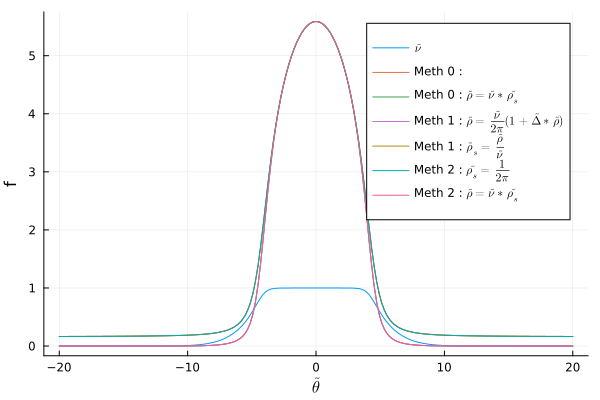

  0.001517 seconds (32 allocations: 1.840 MiB)
saved : test_1/rho_s_discr_1_50.000_100.000.npz
  0.000012 seconds (3 allocations: 1.656 KiB)
saved : test_1/rho_discr_1_50.000_100.000.npz
  0.187261 seconds (68.08 k allocations: 5.531 MiB)
saved : test_1/veff_discr_1_50.000_100.000.npz
saved : test_1/veff_bord_discr_1_50.000_100.000.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


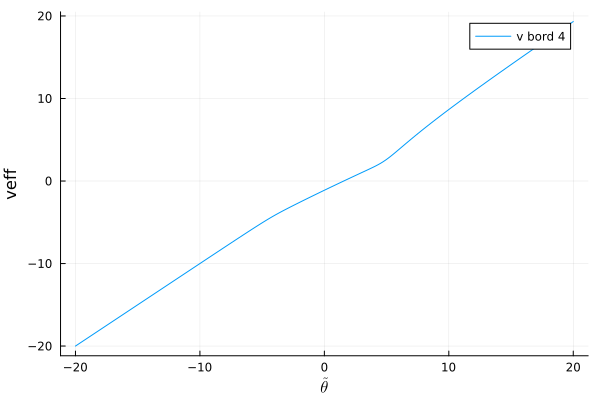

  0.472016 seconds (15.14 M allocations: 368.798 MiB, 15.82% gc time)
saved : test_1/test_1_50.000_100.000_20.000.npz
  0.000007 seconds (121 allocations: 5.109 KiB)
saved : test_1/nu_test_discr_1_50.000_100.000_20.000.npz
theta_star = 3.131 
  0.001108 seconds (32 allocations: 1.840 MiB)
saved : test_1/rho_s_test_discr_1_50.000_100.000_20.000.npz
  0.000010 seconds (3 allocations: 1.656 KiB)
saved : test_1/rho_test_discr_1_50.000_100.000_20.000.npz
moyenn
saved : test_1/nu_test_discr_moy_1_50.000_100.000_20.000_30.000.npz
saved : test_1/rho_s_test_discr_moy_1_50.000_100.000_20.000_30.000.npz
saved : test_1/rho_test_discr_moy_1_50.000_100.000_20.000_30.000.npz


(LinRange{Float64}(-20.0, 20.0, 200), [1.4531222746508125e-9, 2.2058584871022947e-9, 3.334464801109599e-9, 5.019353354315963e-9, 7.523894482865387e-9, 1.1230809827263456e-8, 1.66937178753668e-8, 2.470977912938341e-8, 3.642156845123399e-8, 5.345921946280571e-8  …  5.3459219462805325e-8, 3.642156845123399e-8, 2.470977912938341e-8, 1.66937178753668e-8, 1.1230809827263336e-8, 7.523894482865387e-9, 5.019353354315963e-9, 3.334464801109599e-9, 2.2058584871022947e-9, 1.4531222746508125e-9], [0.22503534685250123, 0.2252002445115282, 0.2253705799433056, 0.22554659938508428, 0.2257285634579668, 0.22591674821868518, 0.2261114463130317, 0.22631296823019098, 0.22652164367512462, 0.22673782307455503  …  0.22673782307455503, 0.22652164367512498, 0.22631296823019112, 0.22611144631303187, 0.22591674821868474, 0.225728563457967, 0.22554659938508462, 0.2253705799433056, 0.22520024451152834, 0.2250353468525013], [3.2700387509514113e-10, 4.967598706532664e-10, 7.514902660266094e-10, 1.1320980801780816e-9, 1

In [42]:
theta_max = 20
npts = 200
theta_discr = LinRange(-theta_max, theta_max , npts) 


#------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , x0 , Taille , t_deform,  gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)

    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)
    
    ## veff de bord j'ai 3 metdode qui donnent la meme foction à voir 
    @time veff_discr = veff( gbar, theta_discr, nu_discr)
    filename = @sprintf "%s/veff_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr )
    println("saved : ", filename)
    
        
    #find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )return ifelse.(theta_discr .> theta_star, 0, nu_discr)
    function f_veff_star_theta_star(theta_star)
        theta_max = last(theta_discr)
        #println(@sprintf "max : %.3f"  maximum(theta_discr))
        #println("mim : " , minimum(theta_discr))    
        if theta_star == -theta_max 
            return -theta_max
        end 
        n_discr_3 = find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
        #plot!(p, theta_discr,  n_discr_3, label="n_{$(theta_star)}")
        #plot!(p1, theta_discr,  veff( gbar, theta_discr, n_discr_3), label="v_{$(theta_star)}")
        veff_fun = LinearInterpolation(theta_discr,veff( gbar, theta_discr, n_discr_3)  )
        return veff_fun(theta_star)
    end 
        
    
    #println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star_2(theta_star))
    #veff_discr_2 = [f_veff_star_theta_star_2(theta) for theta in theta_discr]
        
    L = size(theta_discr)[1]    
    veff_discr_4 = zeros(L)
    #p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="n", legend=:topright)
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    for i = 1 : L 
        veff_discr_4[i] = f_veff_star_theta_star(theta_discr[i])
    end 
    #display(p)
    #display(p1)

    
    #@time veff_discr_3 = [theta_star == theta_max ? theta_max : veff(gbar, LinRange(theta_star, theta_max, 600), LinearInterpolation(theta_discr, nu_discr).(LinRange(theta_star, theta_max, 600)))[1] for theta_star in theta_discr]
    filename = @sprintf "%s/veff_bord_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr_4 )
    println("saved : ", filename)
        
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    #plot!(p, theta_discr, veff_discr, label="v_0")
    plot!(p, theta_discr, veff_discr_4, label="v bord 4")
    display(p)
    
    v = x0 /t_deform       
            
    f = theta_star -> f_veff_star_theta_star(theta_star)-v
    
    @time theta_star = fzero(f, theta_discr[1] , last(theta_discr))
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T x0
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    

    println(@sprintf "theta_star = %.3f " theta_star)



    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    println("moyenn")
    Deltav = Taille/t_deform
    nbsv = 20
    V  = LinRange(v-Deltav/2 , v+Deltav/2 , nbsv )#npts)
    nbsv = size(V)[1]
    dv = Deltav/nbsv
    
    nu_theta_discr_moy = zeros(L)
    rho_s_theta_discr_moy = zeros(L)
    rho_theta_discr_moy = zeros(L)
    
    nbsv = size(V)[1]
    for i = 1 : nbsv
        f = theta_star -> f_veff_star_theta_star(theta_star)-V[i]
        theta_star = fzero(f, theta_discr[1] , last(theta_discr))
        #println(@sprintf "theta_star = %.3f " theta_star)
        nu_theta_star_discr_e = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
        nu_theta_discr_moy += nu_theta_star_discr_e
        rho_s_theta_star_discr_e = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr_e, ones(size(theta_discr)[1]))
        rho_s_theta_discr_moy += rho_s_theta_star_discr_e
        rho_theta_discr_moy += nu_theta_star_discr_e .* rho_s_theta_star_discr_e
    end 
    
    nu_theta_discr_moy = nu_theta_discr_moy*dv/Deltav
    rho_s_theta_discr_moy = rho_s_theta_discr_moy*dv/Deltav
    rho_theta_discr_moy = rho_theta_discr_moy*dv/Deltav
    
    filename = @sprintf "%s/nu_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    nu_theta_discr_moy = Float64.(nu_theta_discr_moy)
    npzwrite(filename, nu_theta_discr_moy )
    println("saved : ", filename)
    
    filename = @sprintf "%s/rho_s_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_s_theta_discr_moy )
    println("saved : ", filename)

    filename = @sprintf "%s/rho_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_theta_discr_moy )
    println("saved : ", filename)
        
        
    
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , veff_discr , veff_discr_4 ,  
                            theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr , nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy 

end 

new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
    end
nom = "test_1"

    
# Afficher la date formatée
println(new_date)
mup = 50 * kB
n_p = "None"
println(n_p)
T = 100                           
theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
    theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr, nu_theta_star_discr_e, rho_s_theta_star_discr_e, rho_theta_discr_moy = 
    save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , 20, 30 ,18 ,  gbar )


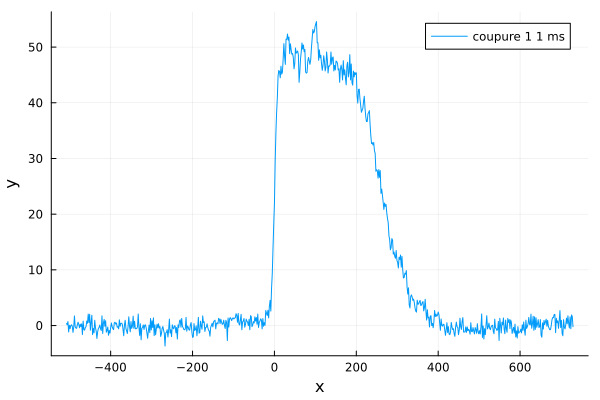

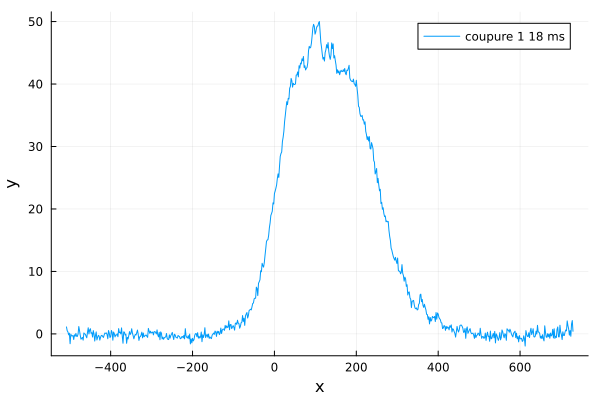

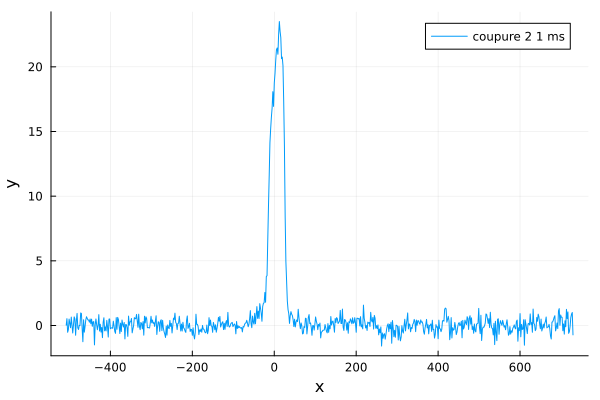

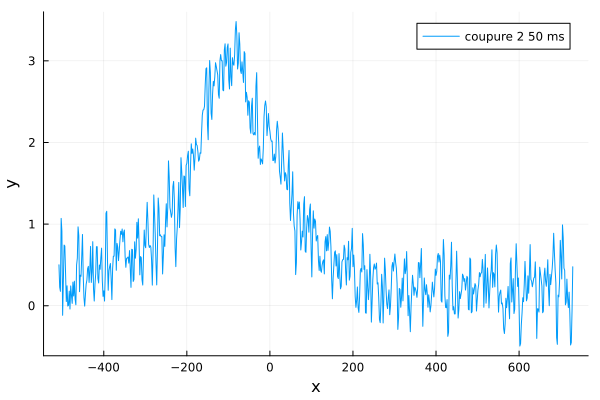

In [56]:
using DelimitedFiles

date_donnees = "2024-02-09"

DONNEES = []

if date_donnees == "None"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-05"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-09"
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_18ms.txt"
    fichier_y = "Y_coupure1_18ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_50ms.txt"
    fichier_y = "Y_coupure2_50ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-29" 
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_28ms.txt"
    fichier_y = "Y_coupure1_28ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 28 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_50ms.txt"
    fichier_y = "Y_coupure2_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-04-24"
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_18ms.txt"
    fichier_y = "Y_coupure1_18ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_30ms.txt"
    fichier_y = "Y_coupure2_30ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 30 ms"]
    push!(DONNEES, Donnees)    
    fichier_x = "X_insitut.txt"
    fichier_y = "Y_insitut.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "insitut"]
    push!(DONNEES, Donnees)                         
end

for i in 1:length(DONNEES)
    p = plot(xlabel="x", ylabel="y", legend=:topright)                           
    x , y , label = DONNEES[i]    
    plot!(p, x,  y, label = label)
    display(p)                         
end                             

# Bord ( 2em coupure homogène)

In [44]:
function pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    
    function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
        
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
    
        tmax = maximum(list_t_save)
        theta_tab = LinRange(-theta_max, theta_max, npts)
        x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
        x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

        t = 0

        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
        println(@sprintf "t = %.3f saved" t*Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t))
        println("saved : ", filename)
        npzwrite(filename, mydensity)

        #p = plot(xlabel="x", ylabel="n", legend=:topright)
        #plot!(p, mydensity[1,:],  mydensity[2,:] )
        #display(p)
        while t<tmax
            x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
            t += dt

            for ts in list_t_save
                if ts <= t < (ts + dt)
                    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                    println(@sprintf "t = %.3f saved" t*Taille)
                    filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                    println("saved : ", filename)
                    npzwrite(filename, mydensity)

                    #p = plot(xlabel="x", ylabel="n", legend=:topright)
                    #plot!(p, mydensity[1,:],  mydensity[2,:] )
                    #display(p)
                end
            end
        end  
        
        p = plot(xlabel="x", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)
        return mydensity[1,:],  mydensity[2,:]
    end
    
    theta_discr , nu_discr , rho_s_discr , rho_discr , veff_bord , veff_bord_coup ,theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    # Créer l'interpolation
    #@time nu_fun = LinearInterpolation(theta_discr, nu_discr)
    @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

    # Afficher l'interpolation
    #p = plot(xlabel="theta", ylabel="nu", legend=:topright)
    #plot!(p, theta_discr,  nu_discr )
    #plot!(p, theta_discr, nu_fun(theta_discr))
    #display(p)
    
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
    temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
    dt = 0.9/Taille
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]

    #temps_sav = [ 50.0/Taille  ]
    dt = 1/Taille
    return box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)
end

nom = "theta_star_1.0_h"
theta_discr = LinRange(-theta_max, theta_max , npts) 

function model_fit_homo(x , p )
    mup , T = p[1]*kB , p[2]
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    
    x_simul , y_simul = pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    density_fun = LinearInterpolation(x_simul , y_simul) 
    p = plot(xlabel="xxx", ylabel="n", legend=:topright)
    plot!(p, x,  last(DONNEES)[2])
    plot!(p, x,  density_fun.(x))
    display(p)
    return Float64.(density_fun.(x))
end 

model_fit_homo (generic function with 1 method)

# Bord (2em coupure ihomogène)

## evolution d'un bord 

In [45]:
#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        #println("vell")
        #@time veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

function evol_edge_expansion_balistic(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
    npts_integral = 600
    
    L = size(x)[1]
    dens = zeros(2,L)
    dens[1,1] = x[1]
    dens[2,1] = 0
    thet1 = theta_tab[1]


    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        nu_discr = nu_fun.(lam_discr)
        dens[1,j] = x[j]      
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    end
    
    println( "la densité haute est : " , dens[2,L])

    #sort densities according to positions, and return
    return dens[:,sortperm(dens[1, :])] #, nu
end



eval_edge_density (generic function with 1 method)

In [53]:
function pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T ,  x0 , Taille , gbar , mode , x , y  )
    
    calcule_deformation, fit_deformation, calcule_expension, fit_expension = mode
    
    nom = "theta_edge_1.0_ih1"
    t_deforme = 18
    
    if calcule_deformation
        
        if fit_deformation && n_p != "None"
            mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
            println( "mup : " , mup , "    " ,  mup/kB )
        end
        
        
        
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
        theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr, nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy = 
        save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T ,x0, Taille , t_deforme, gbar )

        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T)
        filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T)

        function edge_expansion(n_fun, theta_max, npts, gb, ratio_m_hbar)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x = 0.0000001*theta_tab
            
            
            t = 0
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] , label = " t = 0.0000001" )
            #display(p)
            
            t = "veff_bord"
            x += veff_bord_coup
            #filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%s.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) t)
            #println("saved : ", filename)
            #npzwrite(filename, x)
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %s saved" t)
            filename = filename0 * @sprintf("%s.npz", t)
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            
 
            #p = plot(xlabel="v", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:]  , label = " t = hydro ")
            #display(p)
        end

        # Créer l'interpolation
        nu_fun = LinearInterpolation(theta_discr, nu_discr)

        # Afficher l'interpolation
        p1 = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p1, theta_discr,  nu_discr , label = "nu_discret" )
        plot!(p1, theta_discr, nu_fun(theta_discr) , label = "nu_fun(theta_discr)")
        display(p1)

        edge_expansion(nu_fun, theta_max , npts , gbar, mass/hbar)

        ###Coupure de taile $\ell$ + evolution
        t = "veff_bord"
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T)
        filename = filename0 * @sprintf("%s.npz", t)
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        density = npzread(filename)

        

        x1 = density[1,:]#*t_deforme#/Taille
        

        plot!(p,  x1 , density[2,:] , label = " t = 18 ")
        display(p)
        
        if fit_deformation 
            return x1 , density[2,:] 
        end
    end 
    
    if calcule_expension 
   

        nom = "theta_edge_1.0_ih2"
        index_last_underscore = findlast(isequal('_'), nom)
        println(nom[index_last_underscore+1:end])
        
        println("saveeeeeeeee")
        #save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
        theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr, nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy = 
        save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T ,x0, Taille , t_deforme, gbar )


        
        x_fun = LinearInterpolation(theta_discr,x1)
        theta_fun = LinearInterpolation(x1, theta_discr)
        x_1 , x_2= (x0 - Taille/2)/t_deforme , (x0 + Taille/2)/t_deforme
        #x_1 , x_2 = 0.43393268627490844, 1.7461461601247348#0.38599379698434566 , 1.7092275073793108#7.2307096175967445/t_deforme  , 32.01070961759683/t_deforme
        
        theta_1 , theta_2 = theta_fun(x_1), theta_fun(x_2)
        max_abs_theta = maximum([20 , abs(theta_1) , abs(theta_2)])
        
        theta_bord1 = LinRange(-max_abs_theta, theta_1 , 100)
        x1_bord1 = x_1*ones(size(theta_bord1)[1])
        
        
        theta_bord2 = LinRange(theta_1+0.0000001, theta_2 , 100)
        L = size(theta_bord2)[1]
        x1_bord2 = zeros(L)
        for i = 1 : L 
            x1_bord2[i] = x_fun(theta_bord2[i])
        end 
        
        theta_discr = cat(theta_bord1 ,theta_bord2 , dims = 1 )
        x1 = cat(x1_bord1 ,x1_bord2 , dims = 1 )*t_deforme /Taille
        
        x2 = x_2*ones(size(theta_discr)[1])*t_deforme /Taille
        
        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x1 , theta_discr , label = "x1")
        plot!(p,  x2 , theta_discr , label = "x2")
        plot!(p,  x1_bord1 , theta_bord1 , label = "x1_bord1")
        plot!(p,  x1_bord2 , theta_bord2 , label = "x1_bord2")
        
        #vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        display(p)
        
        

        println( mup )
        println("lannnnn")
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille)
        println("lafffff")

        function box_expansion(n_fun,theta_tab, x1 , x2 , dt, list_t_save,  npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            x1 = x1 + 0.0000001*theta_tab
            x2 = x2 + 0.0000001*theta_tab

            t = 0.0000001

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille)  Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x1)
            filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x2)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            println(@sprintf "t = %.3f " t*Taille)
            while t<=tmax

                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
                t += dt
                println(@sprintf "t = %.3f saved" t*Taille)

                for ts in list_t_save
                    if ts - 0.0001/Taille <= t < (ts + dt) + 0.0001/Taille
                        #println( ts , t , ts+dt )
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x1)
                        filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(x0) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x2)
                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)
                    end
                end

            end
            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            return mydensity[1,:],  mydensity[2,:]
        end

        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille ,51.0/Taille ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        #temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille , 100.0/Taille ,200.0/Taille,300.0/Taille,400.0/Taille , 500.0/Taille  ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille ]
        temps_sav = [0.1/Taille , 10/Taille , 20/Taille, 30.0/Taille , 40.0/Taille, 50.0/Taille ]
       
        #temps_sav = [1/Taille]
        dt = 1/Taille

        if fit_expension 
            return box_expansion(nu_fun, theta_discr , x1 , x2 , dt ,temps_sav  , npts , gbar, mass/hbar)
        end

    end
end 

new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)
mup = 23.722 * kB
n_p = 26.6
println(n_p)
T = 346

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 0 == 1 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
#pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , 10 , gbar  , mode , "None" , "None")

test_1
26.6


4-element Vector{Bool}:
 1
 0
 1
 0

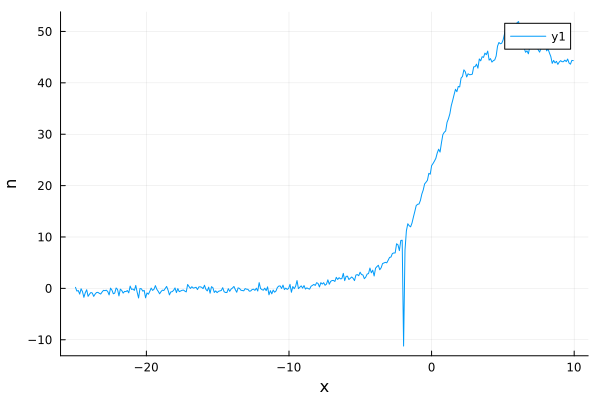

size x dat :(356,)
size(p0) : (1,)
lower_bounds = [174.0174287132106](1,)
upper_bounds = [522.0522861396317](1,)
3
size x_data : (356,)
size y_data : (356,)


In [47]:


function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    nu_fun = LinearInterpolation(theta_discr, nu_discr)
    thet2 , thet1 , npts_integral = theta_discr_integrer[1], theta_discr_integrer[600] , 600
    lam_discr = LinRange(thet2,thet1,npts_integral)
    nu_discr = nu_fun.(lam_discr)    
    densite = mass/hbar* charge_density(gbar, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
    if 1 == 0                                                                    
        # Création du graphique
        p = plot(xlabel="mu", ylabel="densite", legend=:topright)
        # Ajout des points avec des marqueurs personnalisés
        plot!(p, mu, OutDensite, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
        # Affichage du graphique
        display(p)
    end
    
    #println(OutDensite)
    return OutDensite
    
end

if 1 == 0 
    T = LinRange(10, 600 , 3)
    Densite = 56.46504685*ones(size(T)[1])
    p0 = 50*ones(size(T)[1])
    fit = curve_fit(model_mu, T , Densite , p0 )
    
    mu = coef(fit)
    # Création du graphique
    p = plot(xlabel="mu", ylabel="densite", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, mu, model_mu(T,mu), seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
    
    # Création du graphique
    p = plot(xlabel="T", ylabel="mu", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, T, mu, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
end 

function trier_x_et_y(x::Vector{T}, y::Vector{T}) where T
    # Obtenir les indices qui trient x en ordre croissant
    indices_tries = sortperm(x)
    
    # Trier x en ordre croissant
    x_tries = x[indices_tries]
    
    # Réorganiser y en conséquence
    y_tries = y[indices_tries]
    
    return x_tries, y_tries
end
;

fit_deformation = 1 == 1 
fit_expension = 0 == 1
if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 56.46504685
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1)) ) 
    mup = mu*kB
    Taille = 24.780000000000086  #mu m 
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)
    
    calcule_deformation = 1 == 1 # si on veut calculer les deformations
    fit_deformation = 1 == 1 # si on veut fiter la deformation
    
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
    fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, x0 , Taille, gbar , mode , "None" ,"None")    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)
    #x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


#x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 348.0348574264212*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
#fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




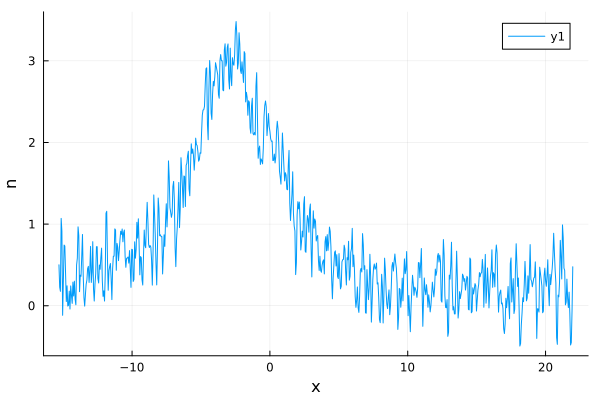

size x dat :(700,)
size(p0) : (1,)
lower_bounds = [300.0](1,)
upper_bounds = [900.0](1,)
3
size x_data : (700,)
size y_data : (700,)
mu = 50.9459540905706
mu = 52.16771310364746
T = 600.0
n_p , model_mu(T , mu) 47.22999999999997
saved : 2024-02-09/theta_discr_ih1.npz
  0.018199 seconds (8.34 k allocations: 6.918 MiB)
saved : 2024-02-09/nu_discr_ih1_52.168_600.000.npz


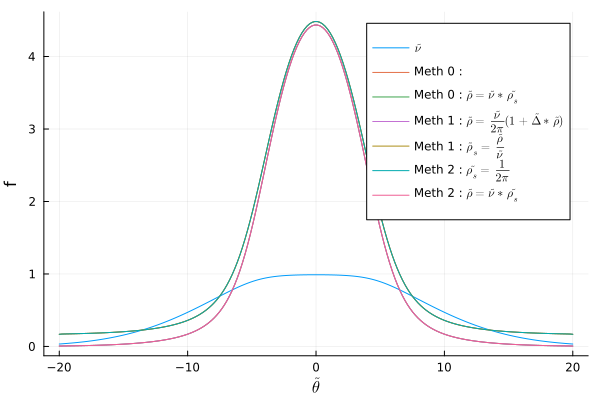

  0.001281 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_52.168_600.000.npz
  0.000010 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_52.168_600.000.npz
  0.001547 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_52.168_600.000.npz
saved : 2024-02-09/veff_bord_discr_ih1_52.168_600.000.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


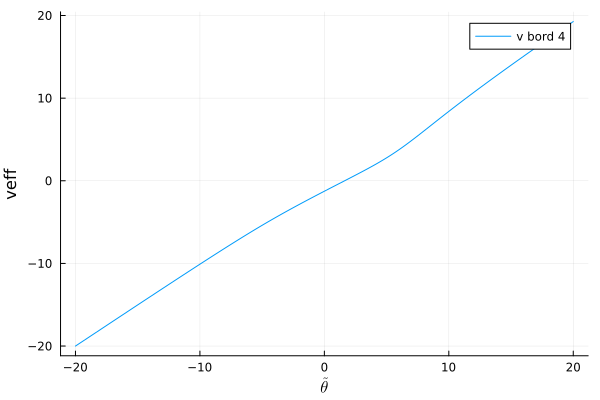

  0.445599 seconds (15.14 M allocations: 368.745 MiB, 14.77% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_52.168_600.000_7.586.npz
  0.000008 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
theta_star = 2.170 
  0.001025 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
  0.000004 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz


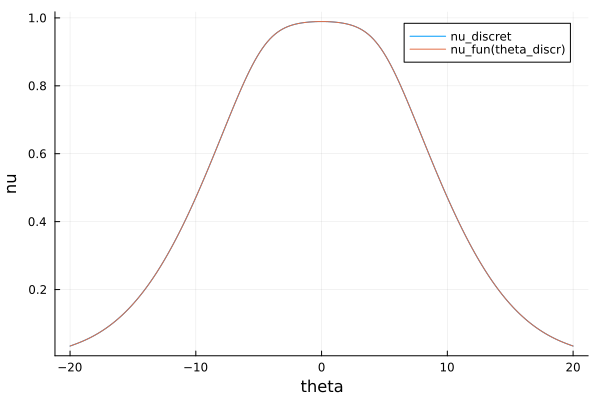

la densité haute est : 47.22999999999997
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.000_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_52.168_600.000_0.000.npz
la densité haute est : 47.22999999999997
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.000_veff_bord.npz


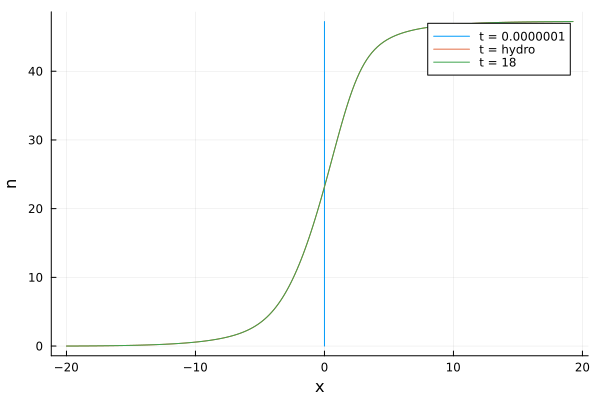

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.021172 seconds (8.34 k allocations: 6.918 MiB)
saved : 2024-02-09/nu_discr_ih2_52.168_600.000.npz


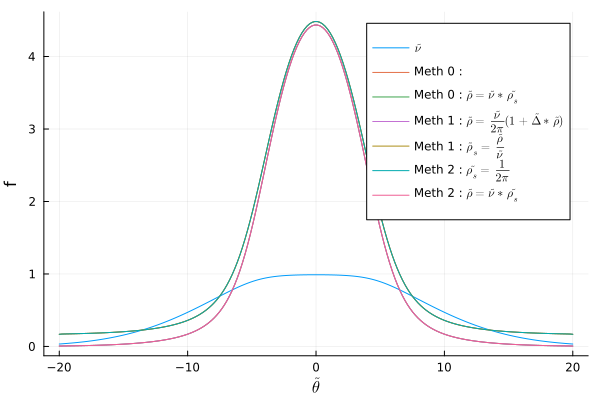

  0.001820 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_52.168_600.000.npz
  0.000010 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_52.168_600.000.npz
  0.005957 seconds (37 allocations: 2.148 MiB, 61.47% gc time)
saved : 2024-02-09/veff_discr_ih2_52.168_600.000.npz
saved : 2024-02-09/veff_bord_discr_ih2_52.168_600.000.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


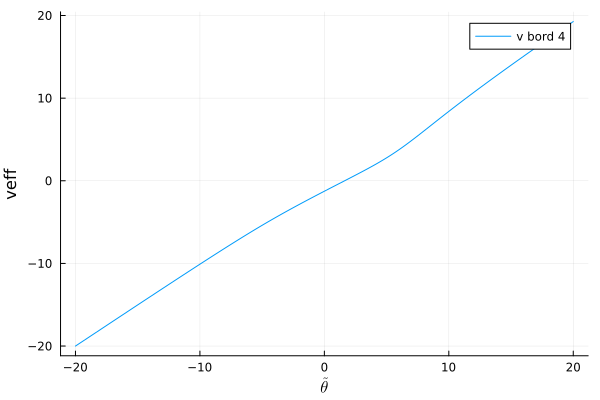

  0.637300 seconds (15.14 M allocations: 368.745 MiB, 7.12% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_52.168_600.000_7.586.npz
  0.000008 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
theta_star = 2.170 
  0.001122 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
  0.000004 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz


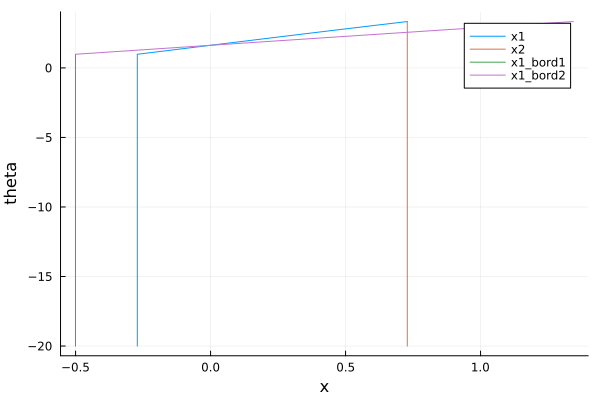

7.202530092883775e-25
lannnnn
lafffff


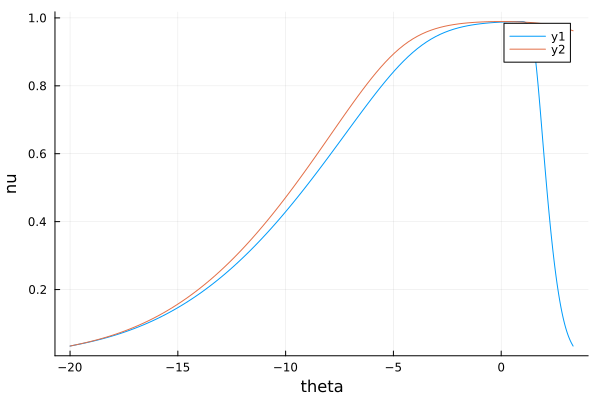

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz


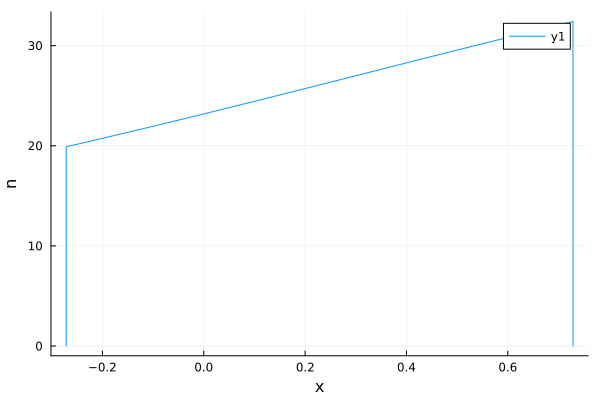

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz


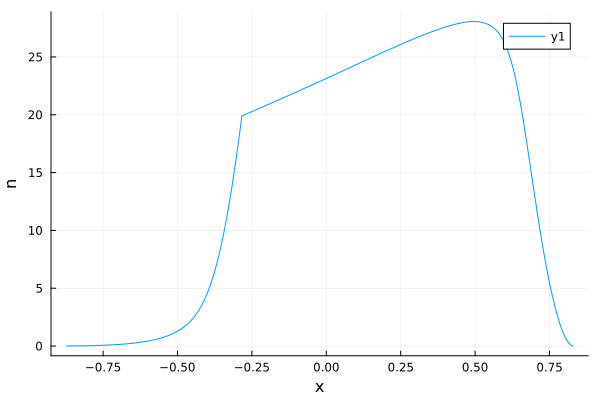

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz


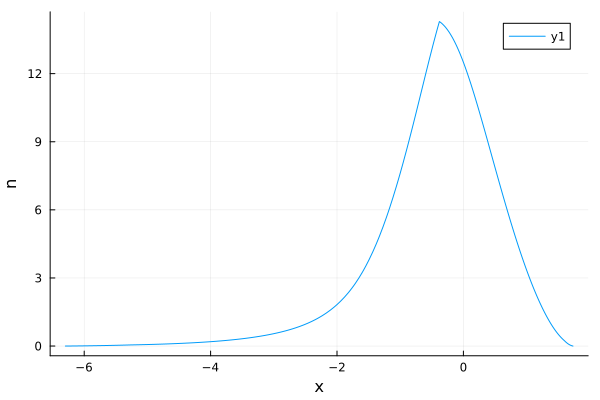

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz


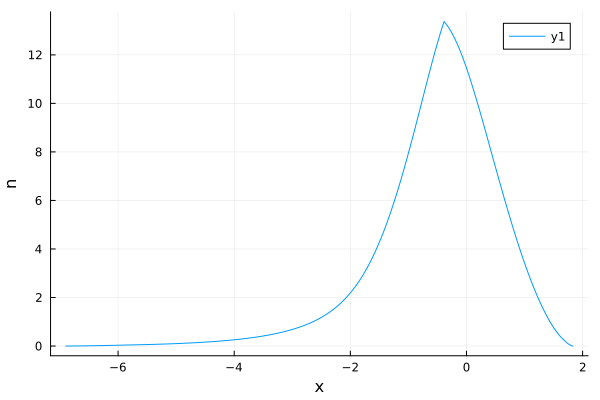

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz


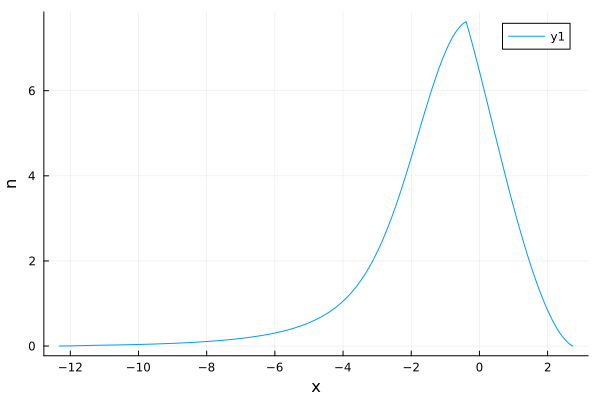

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz


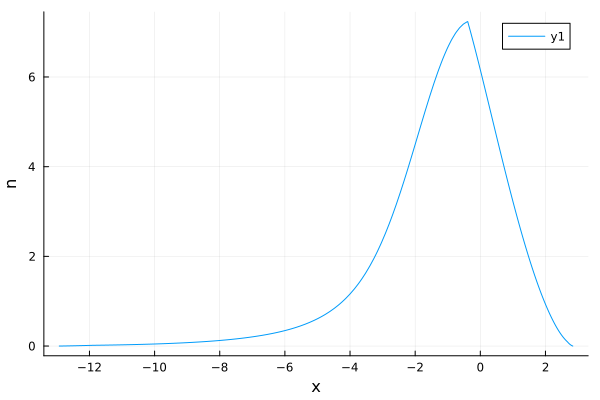

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz


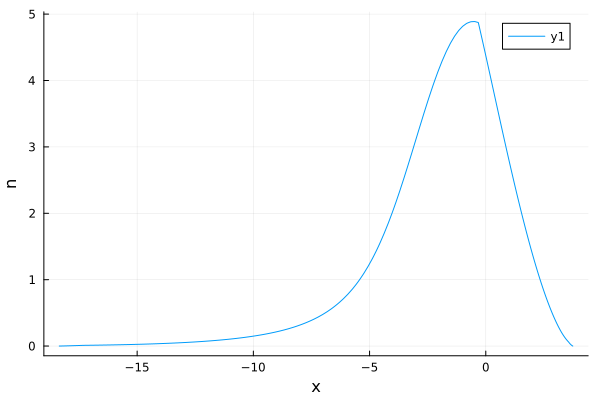

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz


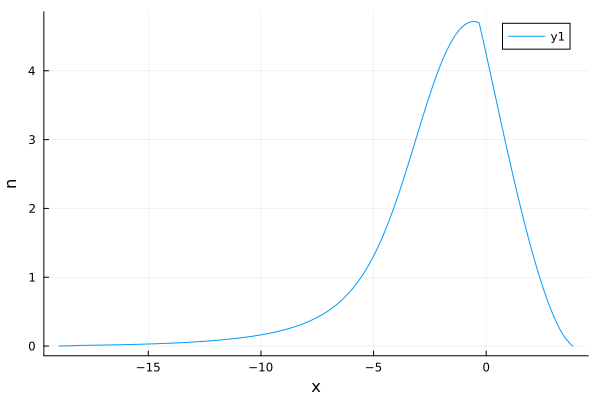

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz


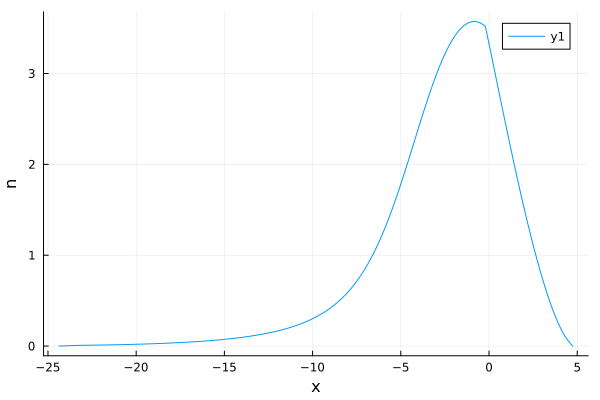

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz


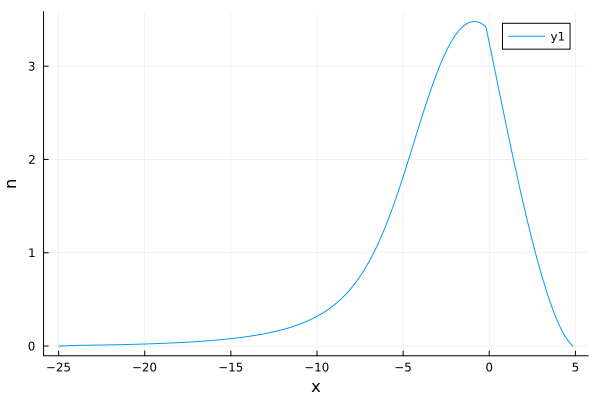

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz


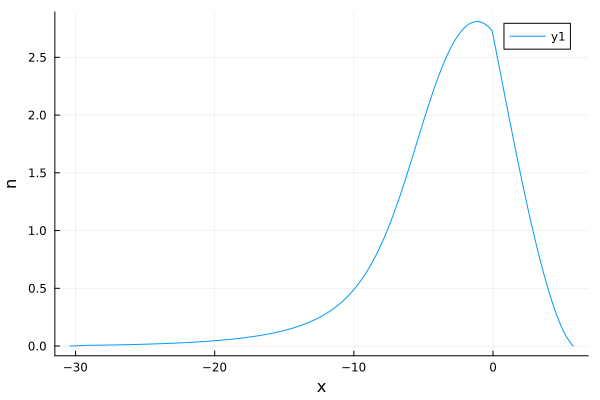

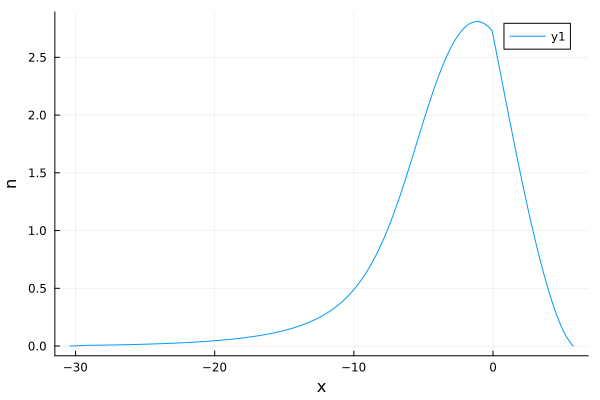

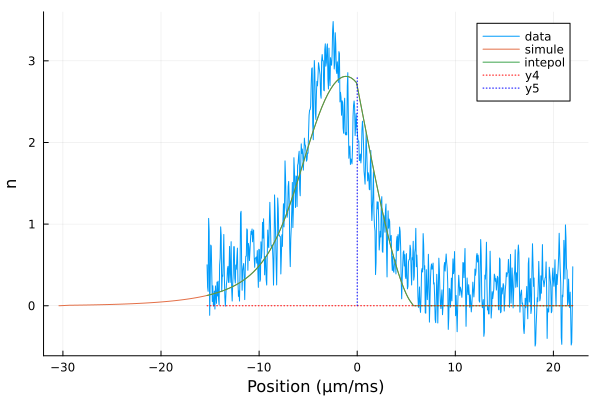

mu = 50.9459540905706
mu = 52.16771310364746
T = 600.0
n_p , model_mu(T , mu) 47.22999999999997
saved : 2024-02-09/theta_discr_ih1.npz
  0.016917 seconds (8.34 k allocations: 6.918 MiB)
saved : 2024-02-09/nu_discr_ih1_52.168_600.000.npz


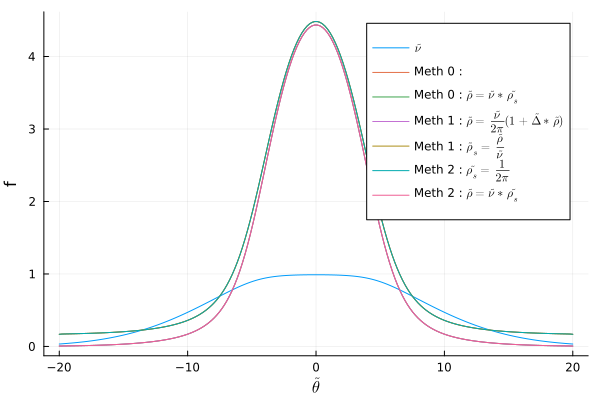

  0.001224 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_52.168_600.000.npz
  0.000009 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_52.168_600.000.npz
  0.001857 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_52.168_600.000.npz
saved : 2024-02-09/veff_bord_discr_ih1_52.168_600.000.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


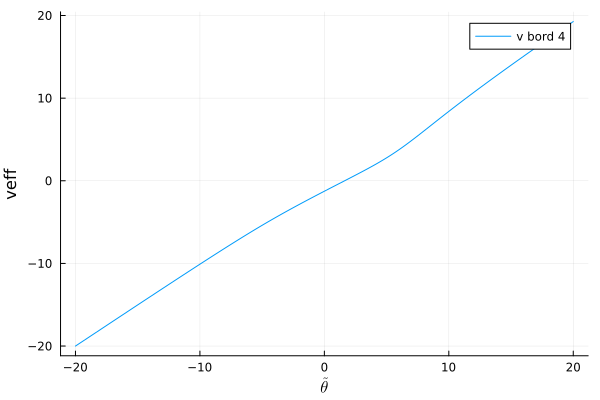

  0.413619 seconds (15.14 M allocations: 368.745 MiB, 11.21% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_52.168_600.000_7.586.npz
  0.000008 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
theta_star = 2.170 
  0.000901 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
  0.000009 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_52.168_600.000_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_52.168_600.000_7.586_33.187.npz


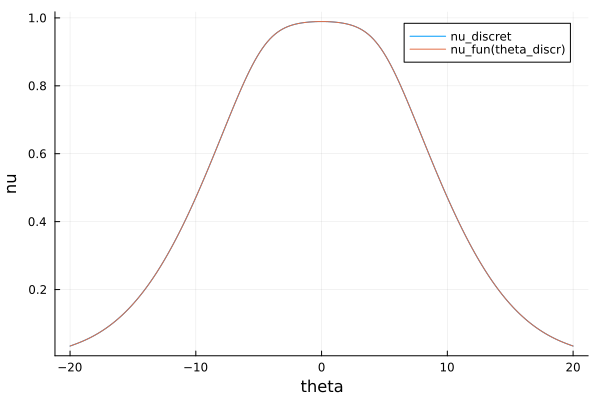

la densité haute est : 47.22999999999997
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.000_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_52.168_600.000_0.000.npz
la densité haute est : 47.22999999999997
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.000_veff_bord.npz


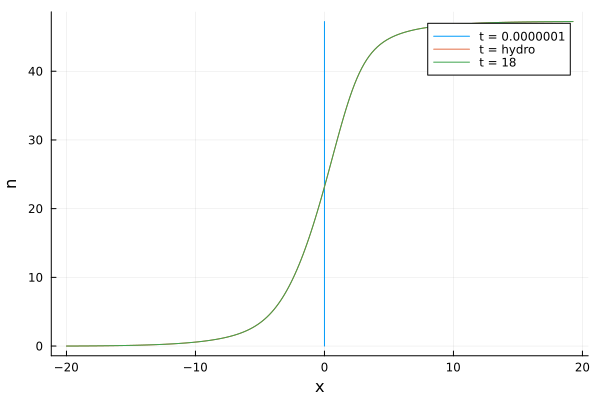

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.015175 seconds (8.34 k allocations: 6.918 MiB, 16.47% gc time)
saved : 2024-02-09/nu_discr_ih2_52.168_600.000.npz


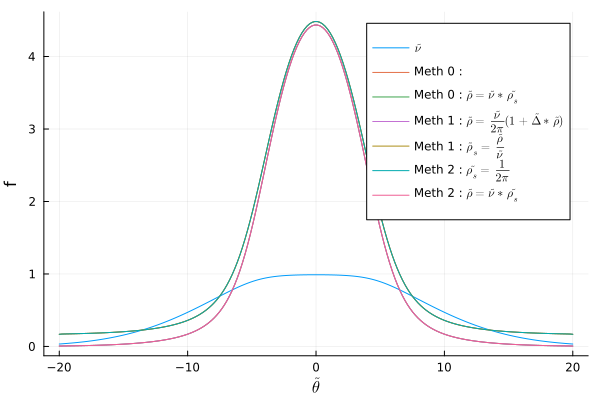

  0.000911 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_52.168_600.000.npz
  0.000007 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_52.168_600.000.npz
  0.001295 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_52.168_600.000.npz
saved : 2024-02-09/veff_bord_discr_ih2_52.168_600.000.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


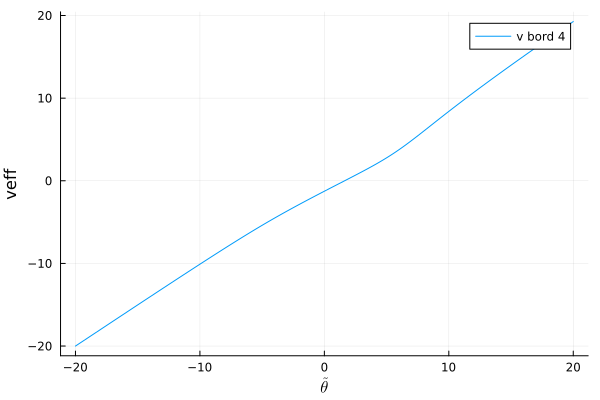

  0.407675 seconds (15.14 M allocations: 368.745 MiB, 10.20% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_52.168_600.000_7.586.npz
  0.000009 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
theta_star = 2.170 
  0.000910 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
  0.000006 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_52.168_600.000_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_52.168_600.000_7.586_33.187.npz


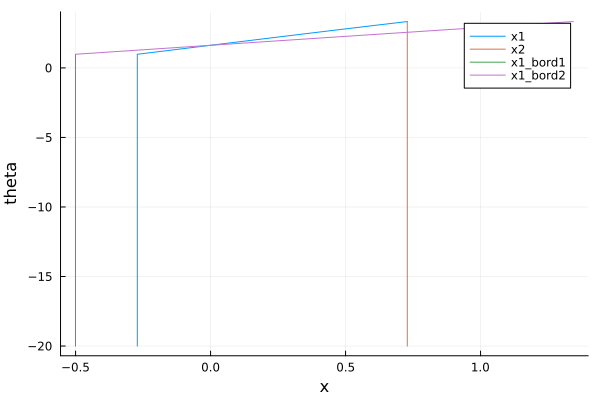

7.202530092883775e-25
lannnnn
lafffff


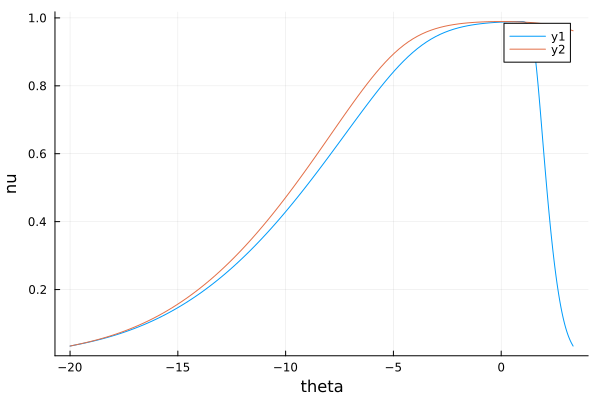

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_0.000.npz


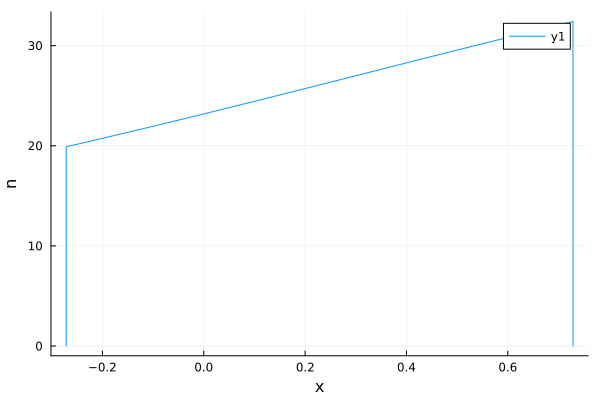

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_1.000.npz


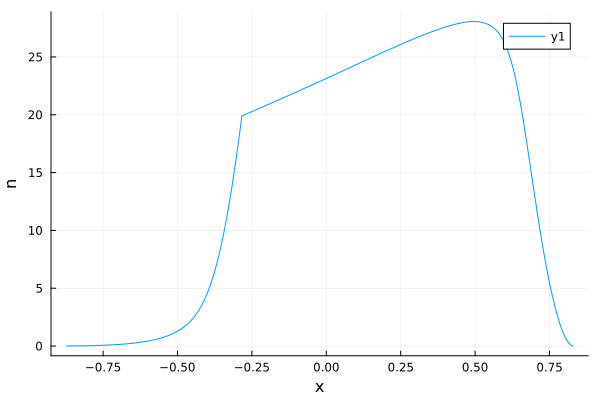

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_10.000.npz


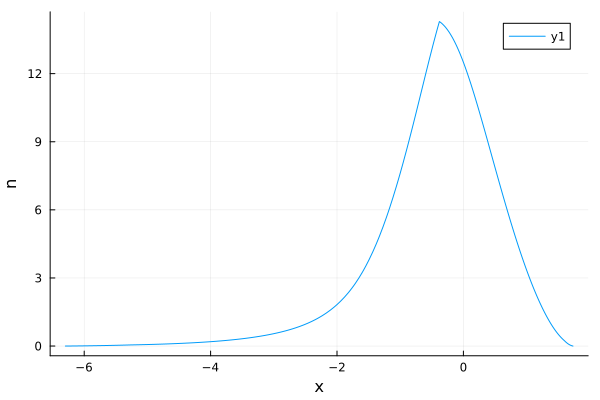

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_11.000.npz


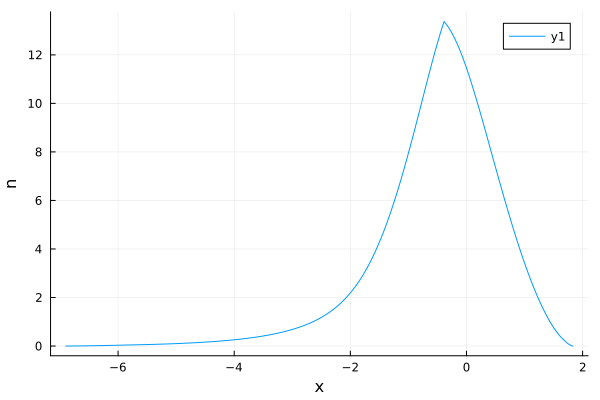

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_20.000.npz


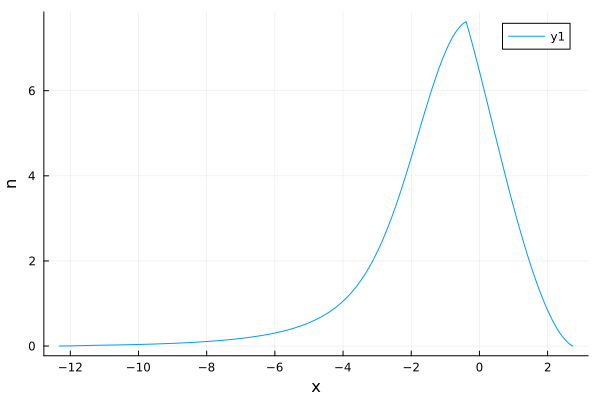

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_21.000.npz


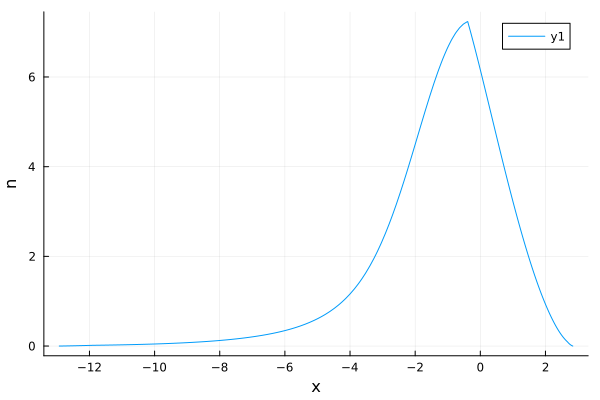

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_30.000.npz


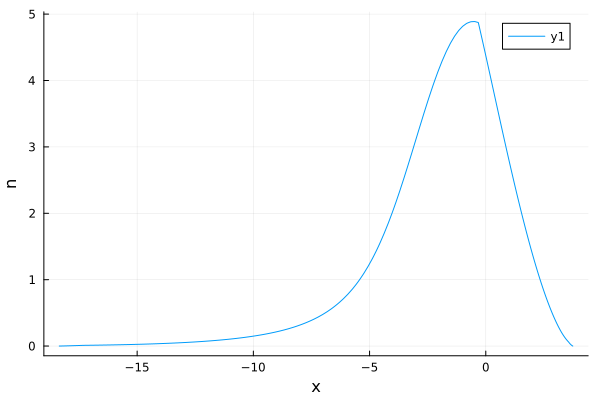

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_31.000.npz


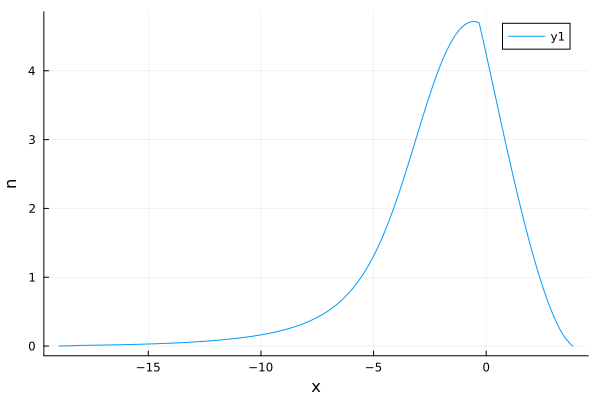

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_40.000.npz


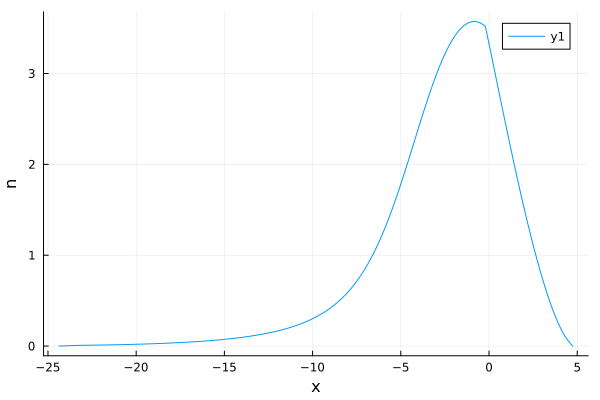

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_41.000.npz


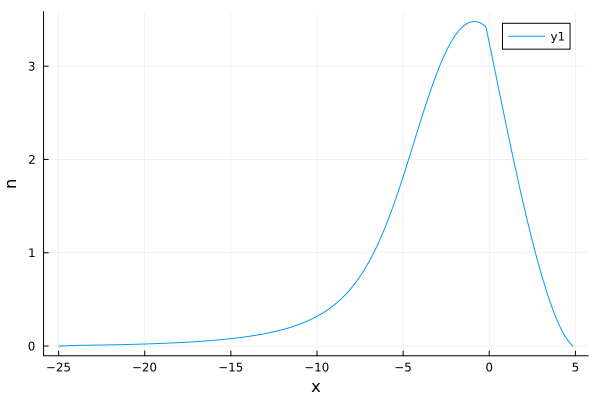

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.000_7.586_33.187_50.000.npz


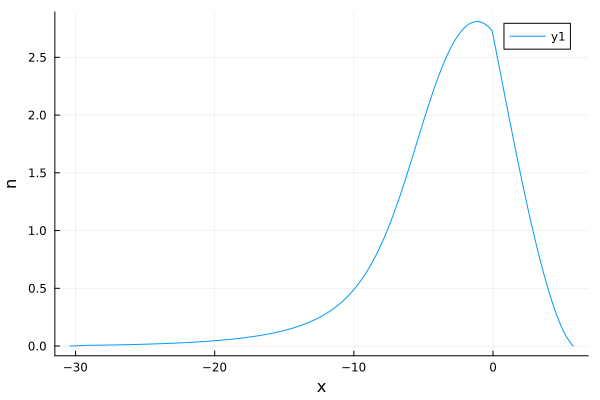

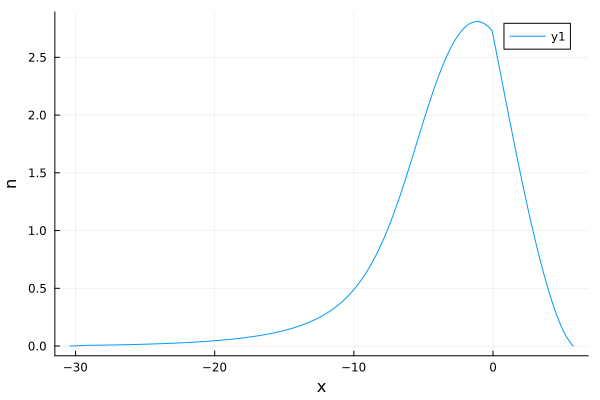

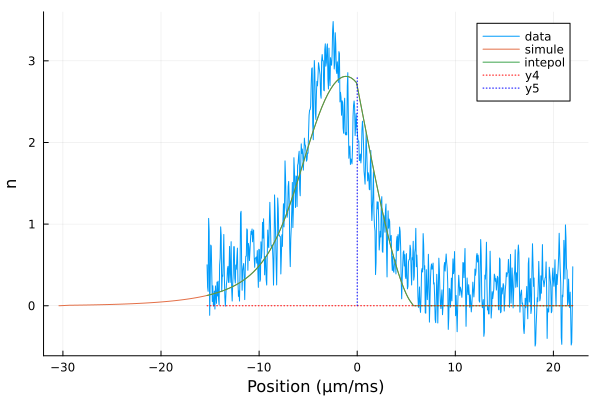

mu = 50.9459540905706
mu = 52.1676153109681
T = 600.0036332726714
n_p , model_mu(T , mu) 47.23000000000001
saved : 2024-02-09/theta_discr_ih1.npz
  0.017185 seconds (8.34 k allocations: 6.918 MiB)
saved : 2024-02-09/nu_discr_ih1_52.168_600.004.npz


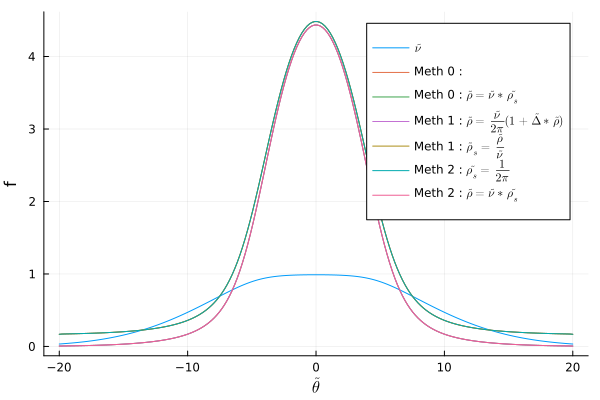

  0.001334 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_52.168_600.004.npz
  0.000010 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_52.168_600.004.npz
  0.002472 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_52.168_600.004.npz
saved : 2024-02-09/veff_bord_discr_ih1_52.168_600.004.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


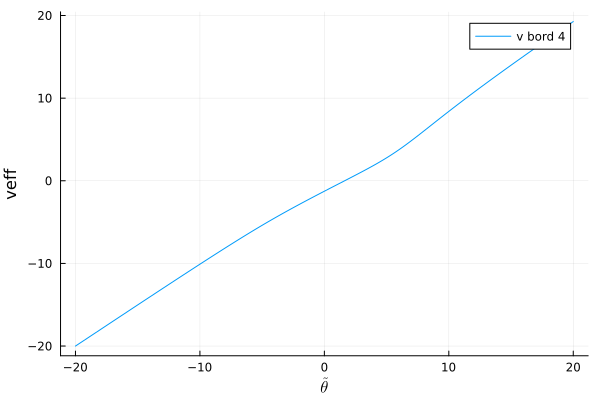

  0.643150 seconds (15.14 M allocations: 368.745 MiB, 8.53% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_52.168_600.004_7.586.npz
  0.000012 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_52.168_600.004_7.586.npz
theta_star = 2.170 
  0.001145 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_52.168_600.004_7.586.npz
  0.000012 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_52.168_600.004_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_52.168_600.004_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_52.168_600.004_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_52.168_600.004_7.586_33.187.npz


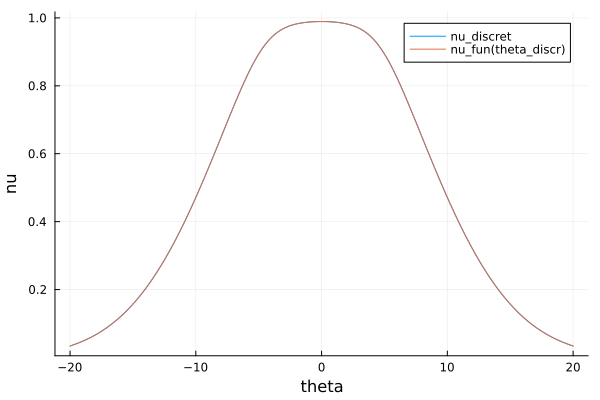

la densité haute est : 47.23000000000001
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.004_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_52.168_600.004_0.000.npz
la densité haute est : 47.23000000000001
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_600.004_veff_bord.npz


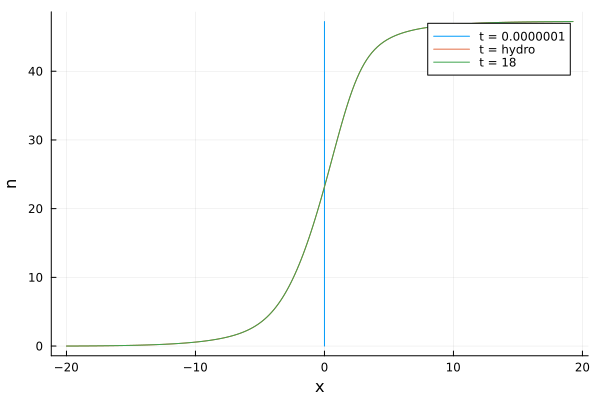

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.017062 seconds (8.34 k allocations: 6.918 MiB)
saved : 2024-02-09/nu_discr_ih2_52.168_600.004.npz


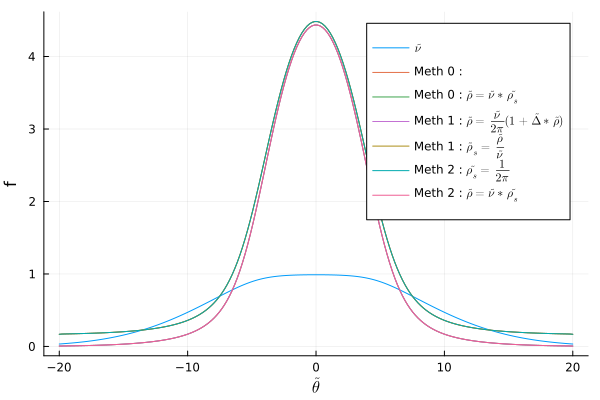

  0.001154 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_52.168_600.004.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_52.168_600.004.npz
  0.005428 seconds (37 allocations: 2.148 MiB, 65.83% gc time)
saved : 2024-02-09/veff_discr_ih2_52.168_600.004.npz
saved : 2024-02-09/veff_bord_discr_ih2_52.168_600.004.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


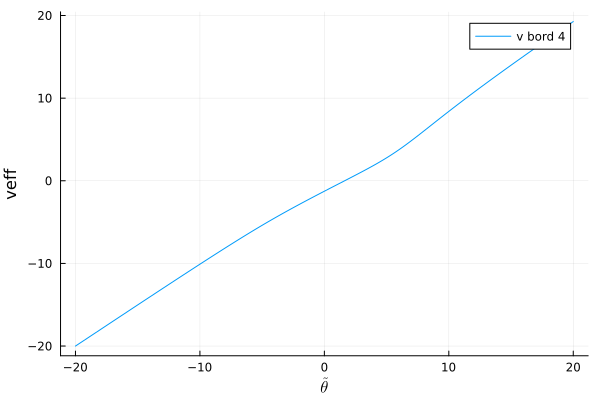

  0.654383 seconds (15.14 M allocations: 368.745 MiB, 8.01% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_52.168_600.004_7.586.npz
  0.000009 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_52.168_600.004_7.586.npz
theta_star = 2.170 
  0.001147 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_52.168_600.004_7.586.npz
  0.000004 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_52.168_600.004_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_52.168_600.004_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_52.168_600.004_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_52.168_600.004_7.586_33.187.npz


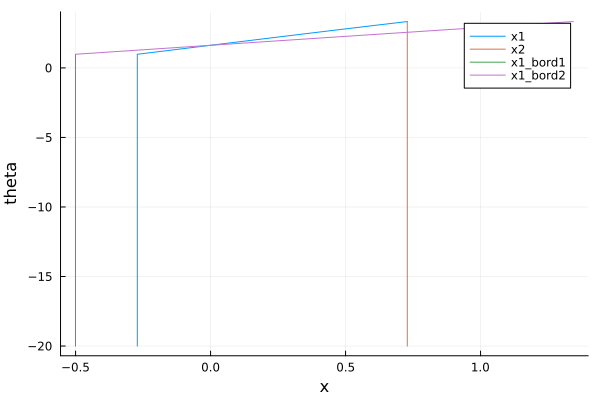

7.20251659114728e-25
lannnnn
lafffff


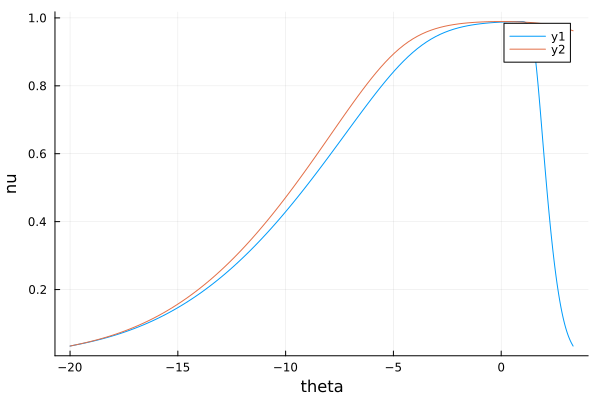

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_0.000.npz


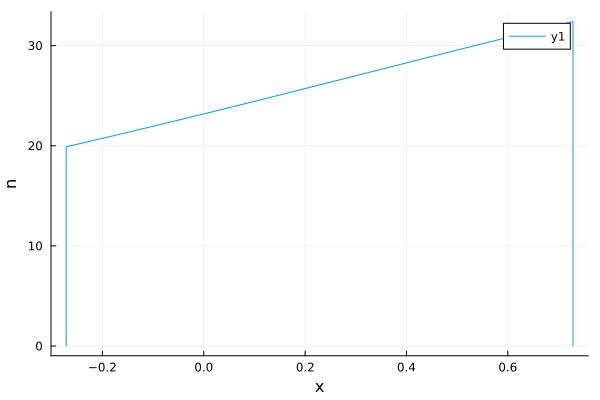

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_1.000.npz


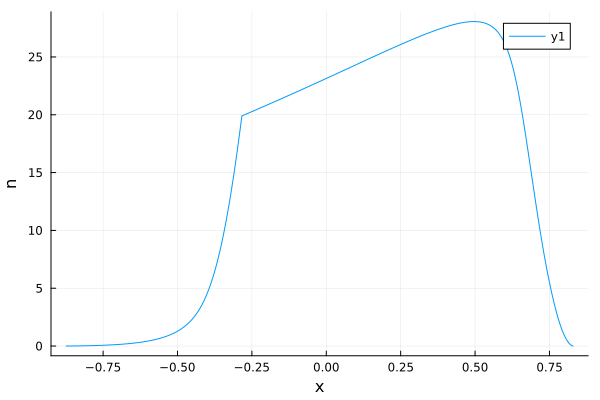

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_10.000.npz


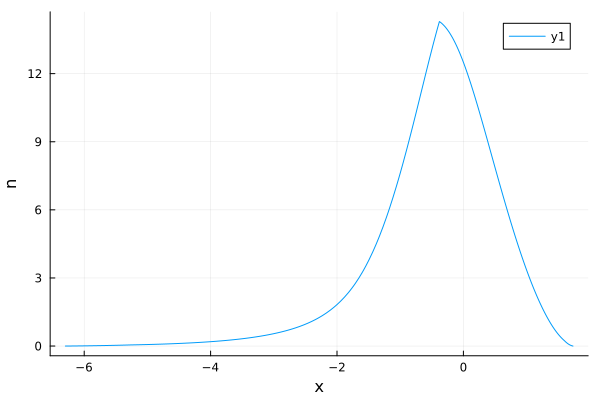

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_11.000.npz


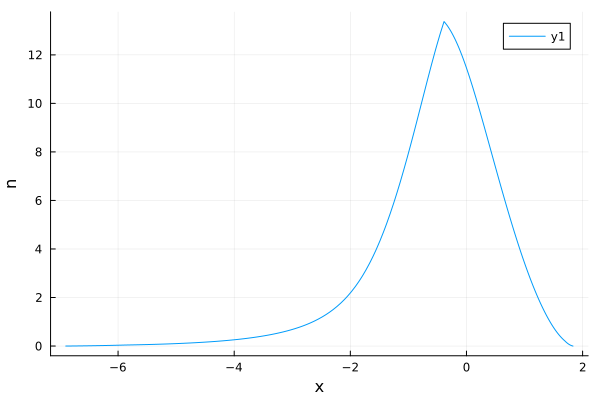

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_20.000.npz


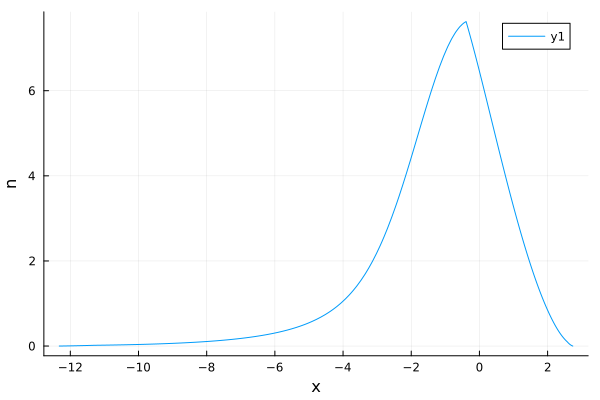

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_21.000.npz


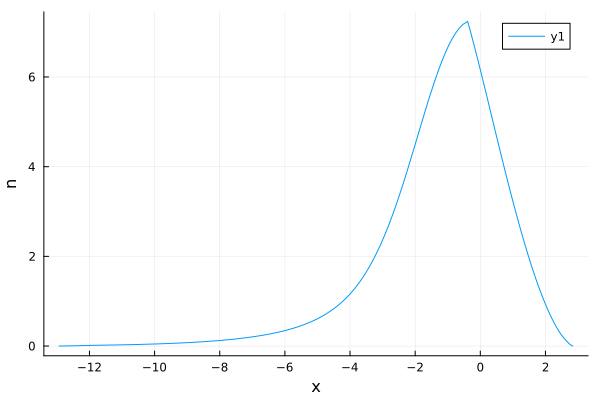

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_30.000.npz


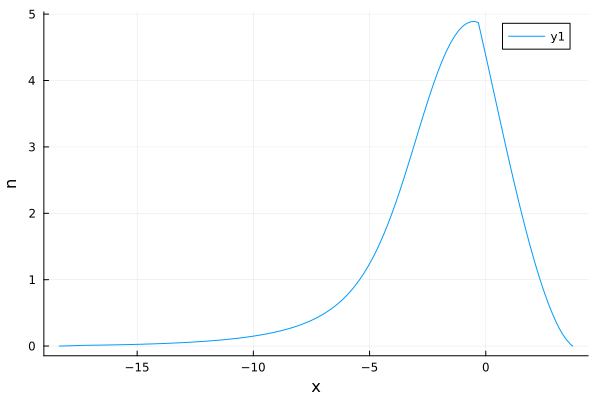

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_31.000.npz


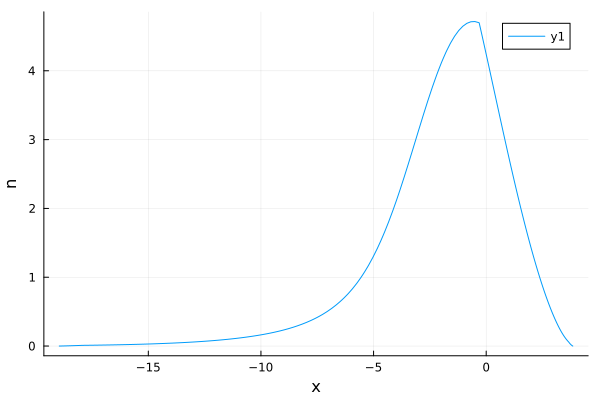

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_40.000.npz


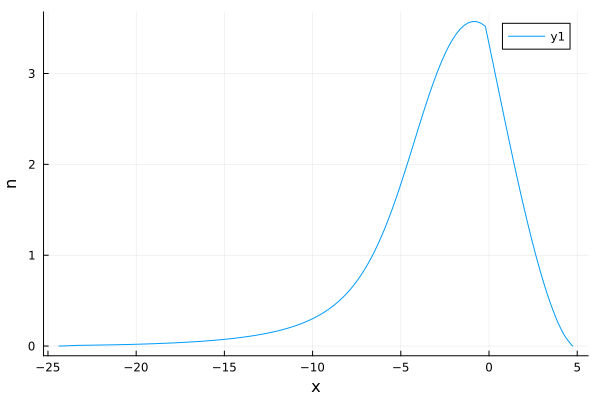

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_41.000.npz


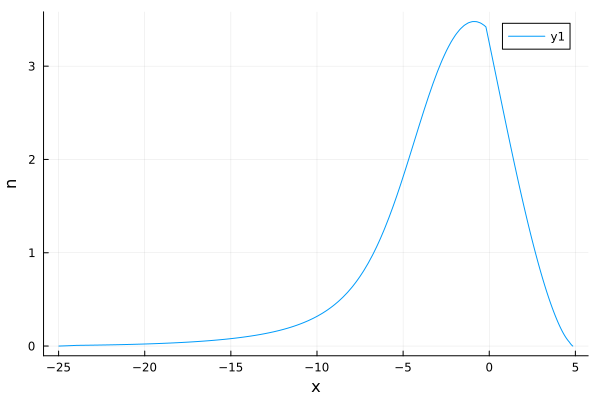

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_600.004_7.586_33.187_50.000.npz


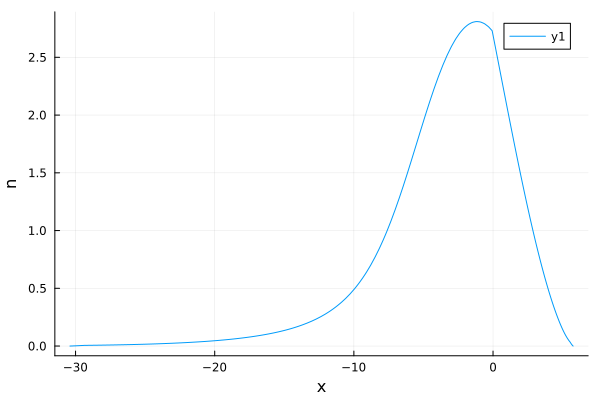

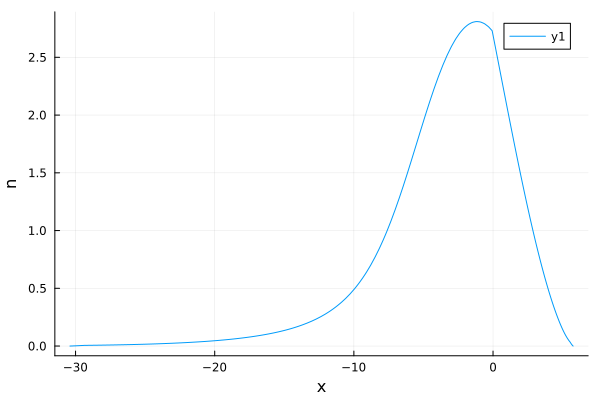

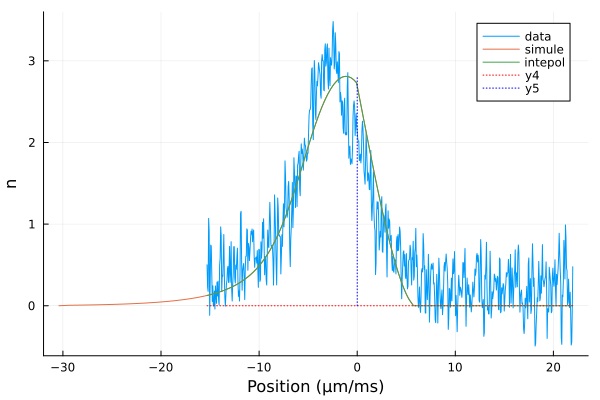

mu = 50.9459540905706
mu = 52.16781089520876
T = 599.9963667273286
n_p , model_mu(T , mu) 47.229999999999976
saved : 2024-02-09/theta_discr_ih1.npz
  0.018594 seconds (8.34 k allocations: 6.918 MiB, 11.10% gc time)
saved : 2024-02-09/nu_discr_ih1_52.168_599.996.npz


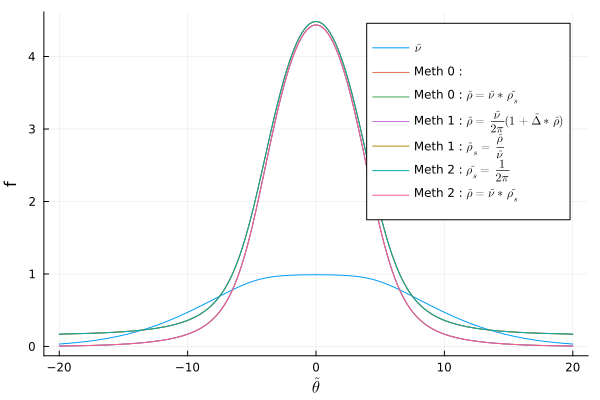

  0.001000 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_52.168_599.996.npz
  0.000007 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_52.168_599.996.npz
  0.001328 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_52.168_599.996.npz
saved : 2024-02-09/veff_bord_discr_ih1_52.168_599.996.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


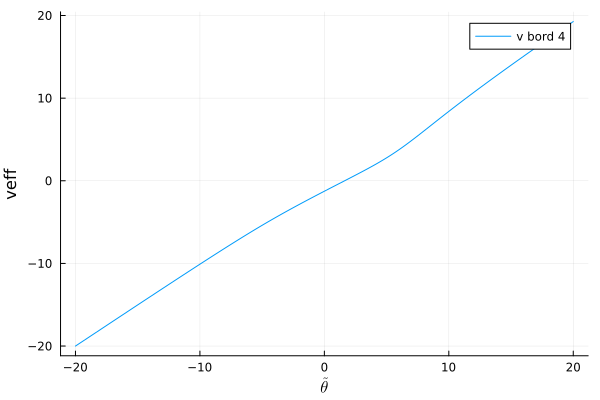

  0.409624 seconds (15.14 M allocations: 368.745 MiB, 9.01% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_52.168_599.996_7.586.npz
  0.000008 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_52.168_599.996_7.586.npz
theta_star = 2.170 
  0.000907 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_52.168_599.996_7.586.npz
  0.000006 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_52.168_599.996_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_52.168_599.996_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_52.168_599.996_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_52.168_599.996_7.586_33.187.npz


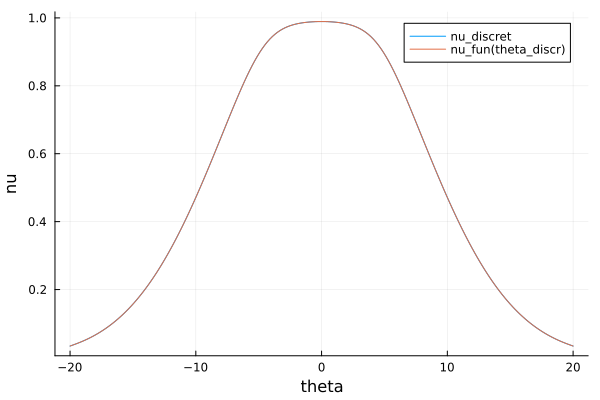

la densité haute est : 47.229999999999976
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_599.996_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_52.168_599.996_0.000.npz
la densité haute est : 47.229999999999976
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_52.168_599.996_veff_bord.npz


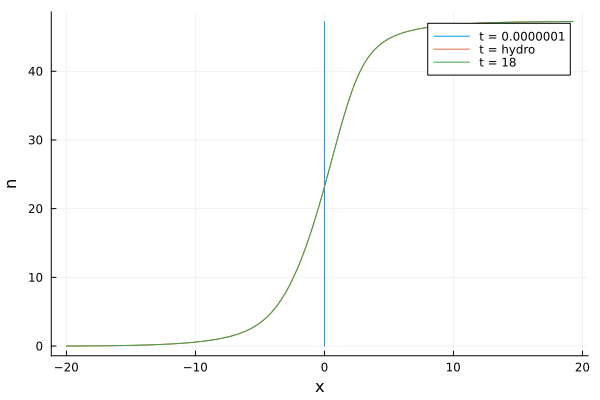

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.020036 seconds (8.34 k allocations: 6.918 MiB, 11.57% gc time)
saved : 2024-02-09/nu_discr_ih2_52.168_599.996.npz


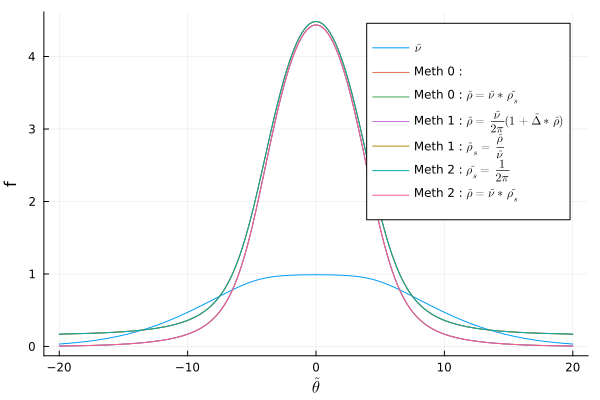

  0.001265 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_52.168_599.996.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_52.168_599.996.npz
  0.001802 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_52.168_599.996.npz
saved : 2024-02-09/veff_bord_discr_ih2_52.168_599.996.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


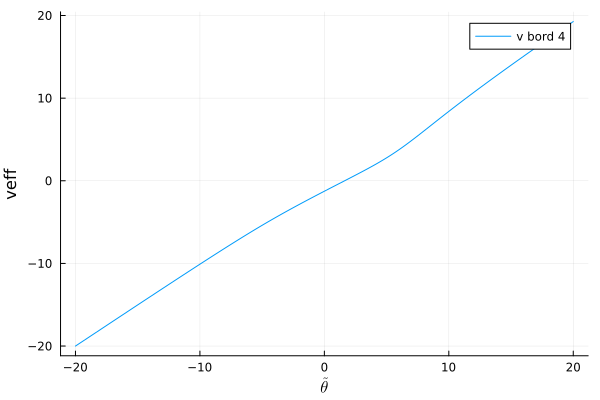

  0.449203 seconds (15.14 M allocations: 368.745 MiB, 7.92% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_52.168_599.996_7.586.npz
  0.000007 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_52.168_599.996_7.586.npz
theta_star = 2.170 
  0.000984 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_52.168_599.996_7.586.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_52.168_599.996_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_52.168_599.996_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_52.168_599.996_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_52.168_599.996_7.586_33.187.npz


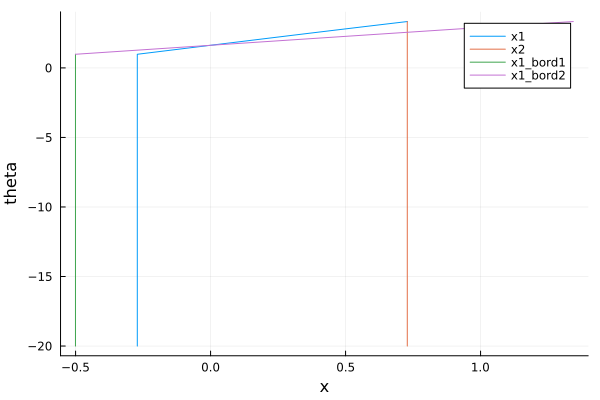

7.202543594465908e-25
lannnnn
lafffff


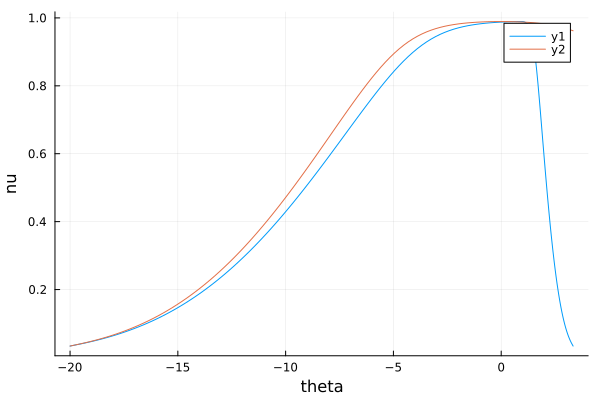

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_0.000.npz


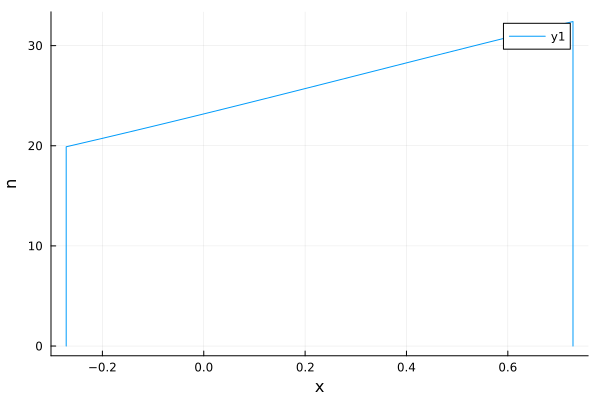

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_1.000.npz


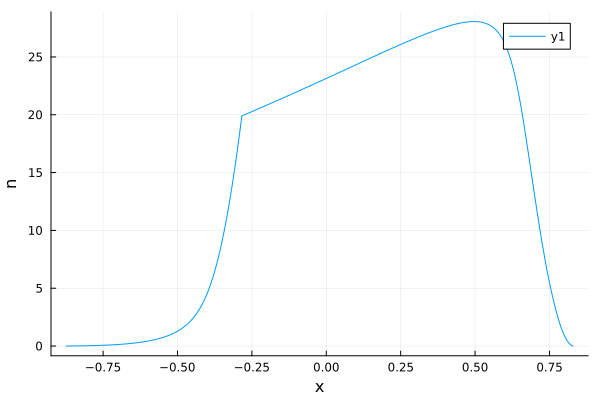

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_10.000.npz


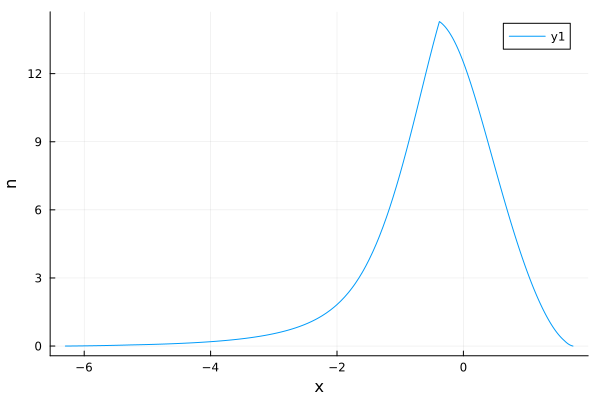

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_11.000.npz


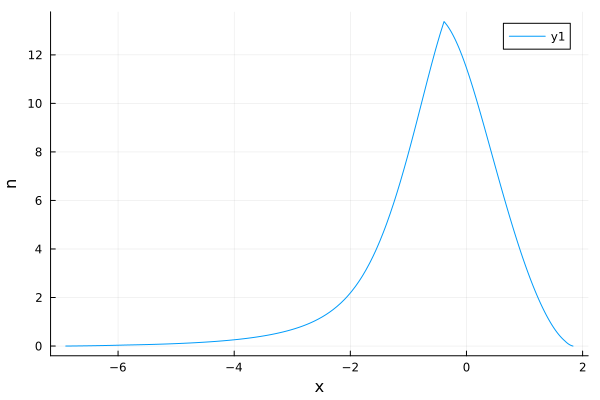

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_20.000.npz


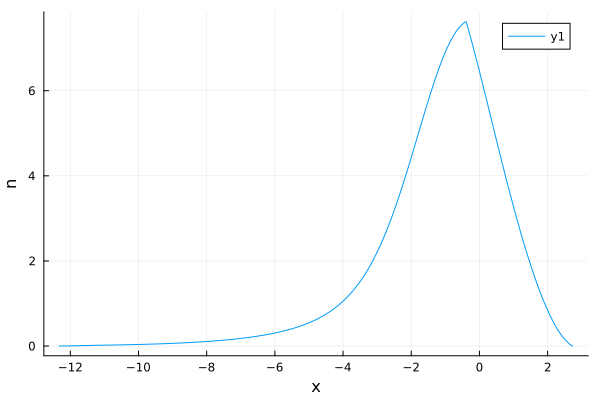

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_21.000.npz


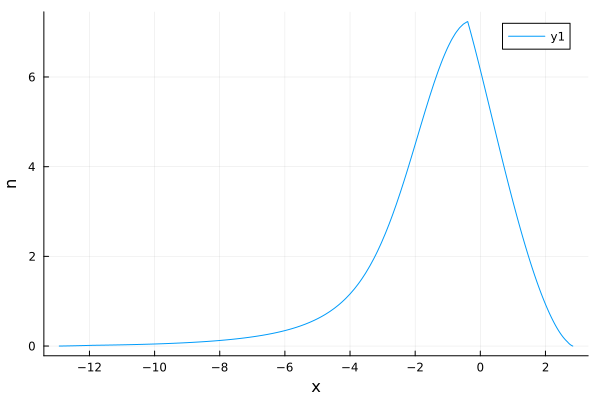

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_30.000.npz


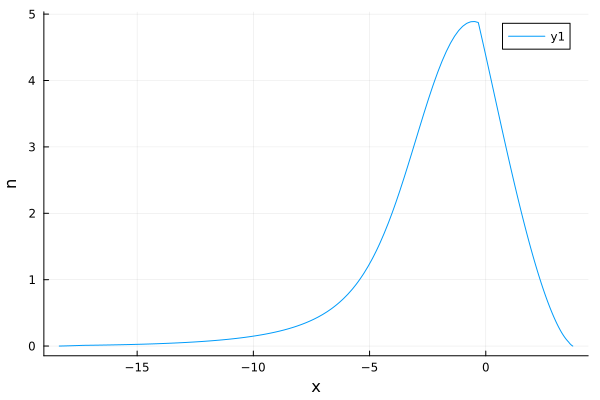

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_31.000.npz


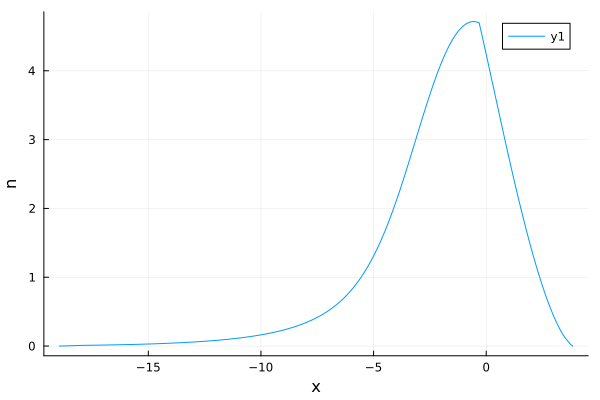

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_40.000.npz


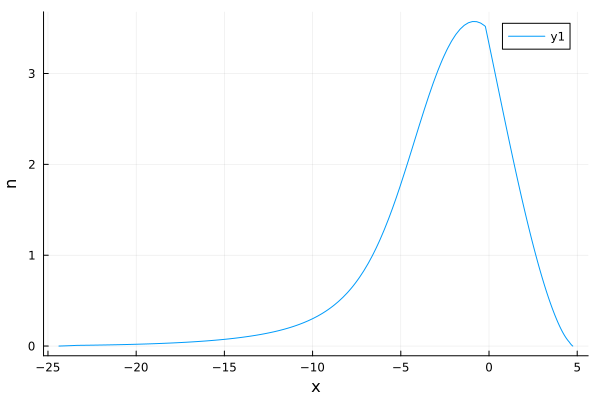

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_41.000.npz


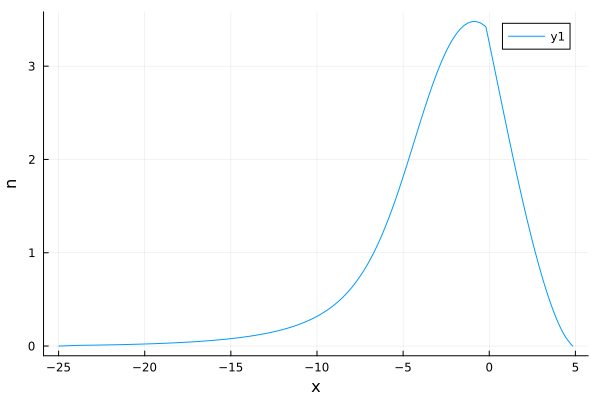

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_52.168_599.996_7.586_33.187_50.000.npz


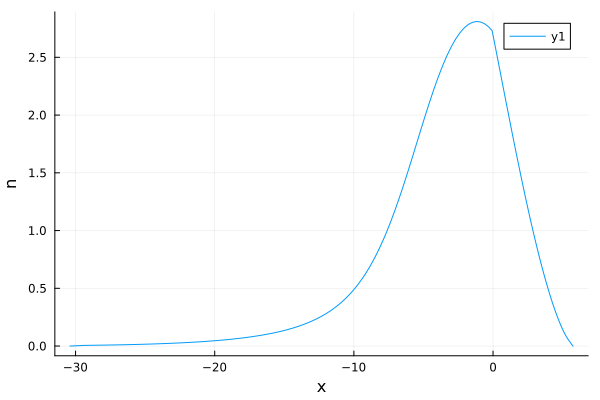

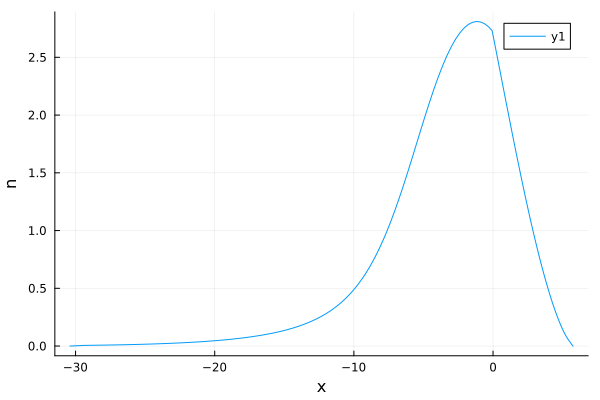

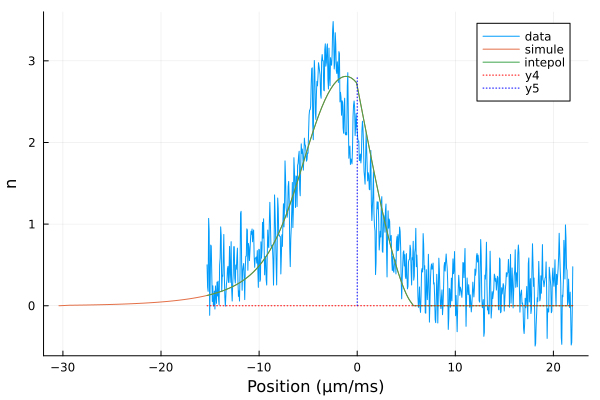

mu = 50.9459540905706
mu = 51.80040443152512
T = 613.3669187295022
n_p , model_mu(T , mu) 47.23000000000003
saved : 2024-02-09/theta_discr_ih1.npz
  0.016311 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih1_51.800_613.367.npz


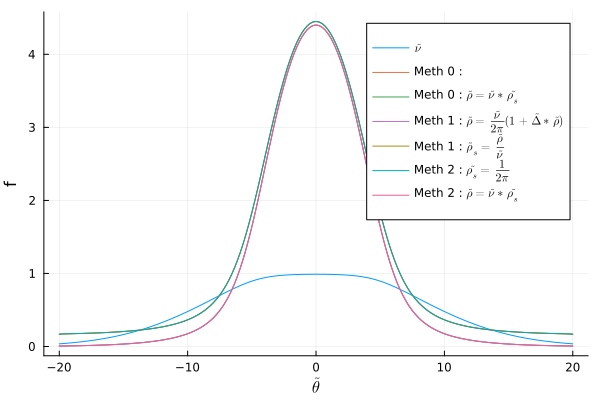

  0.001391 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_51.800_613.367.npz
  0.000008 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_51.800_613.367.npz
  0.001541 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_51.800_613.367.npz
saved : 2024-02-09/veff_bord_discr_ih1_51.800_613.367.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


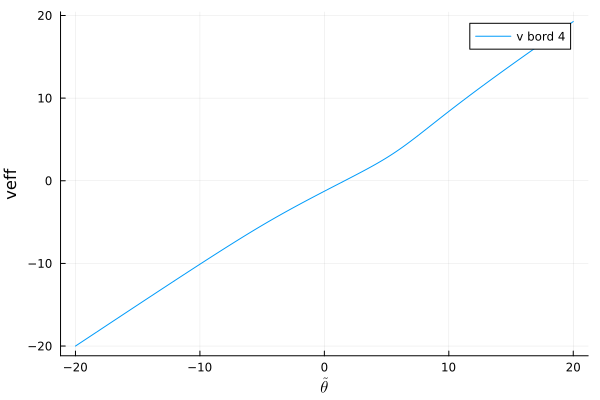

  0.595670 seconds (15.14 M allocations: 368.745 MiB, 6.45% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_51.800_613.367_7.586.npz
  0.000009 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
theta_star = 2.167 
  0.001028 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
  0.000005 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz


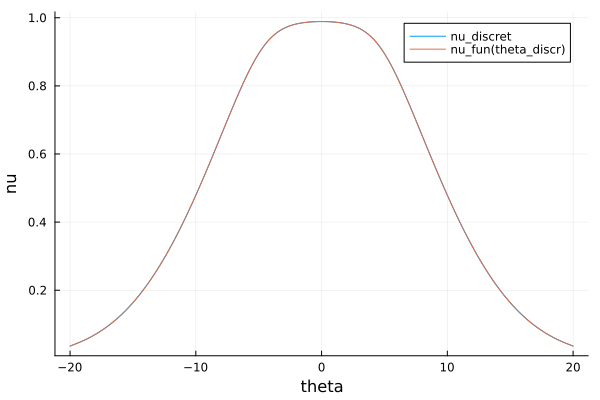

la densité haute est : 47.23000000000003
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.367_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_51.800_613.367_0.000.npz
la densité haute est : 47.23000000000003
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.367_veff_bord.npz


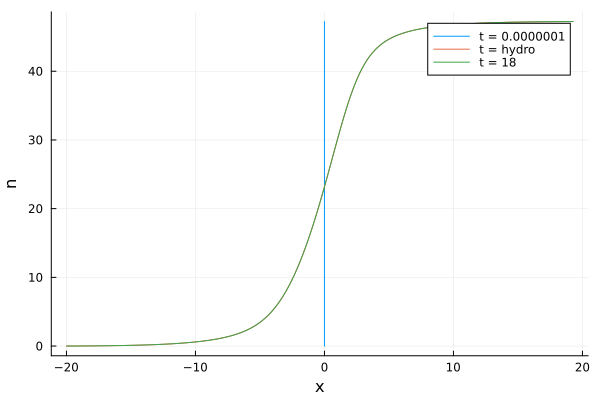

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.017696 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih2_51.800_613.367.npz


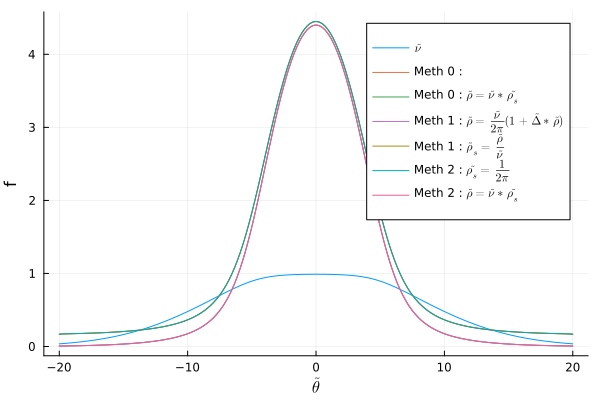

  0.004154 seconds (32 allocations: 1.840 MiB, 64.66% gc time)
saved : 2024-02-09/rho_s_discr_ih2_51.800_613.367.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_51.800_613.367.npz
  0.001527 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_51.800_613.367.npz
saved : 2024-02-09/veff_bord_discr_ih2_51.800_613.367.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


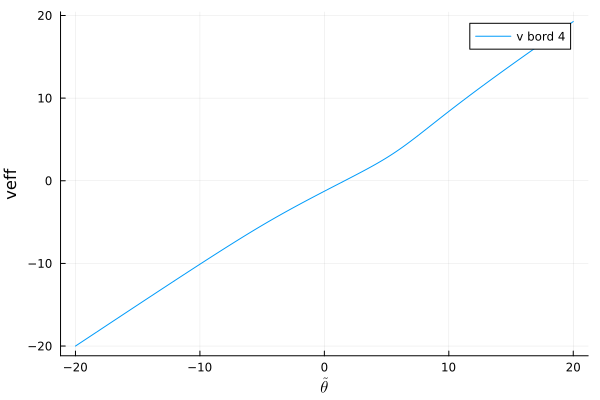

  0.426997 seconds (15.14 M allocations: 368.745 MiB, 8.49% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_51.800_613.367_7.586.npz
  0.000007 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
theta_star = 2.167 
  0.001027 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
  0.000004 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz


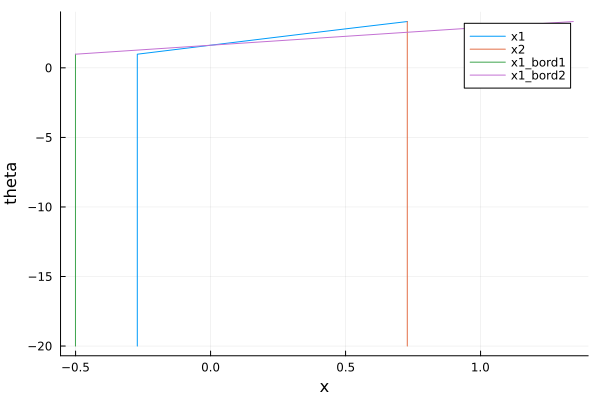

7.151817657798073e-25
lannnnn
lafffff


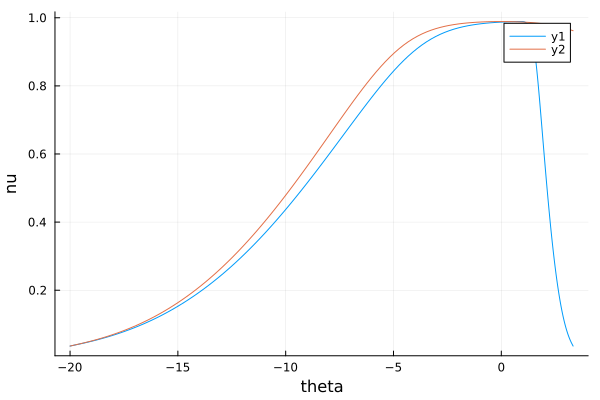

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz


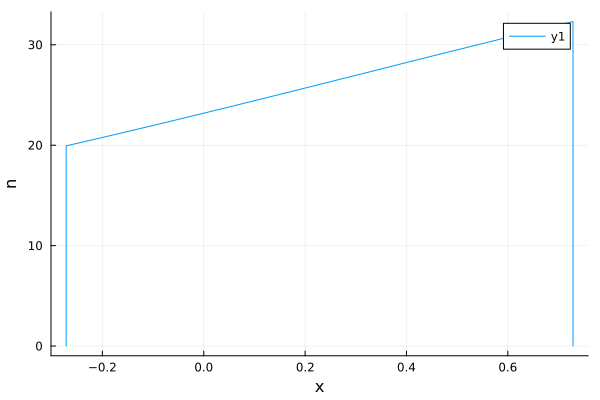

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz


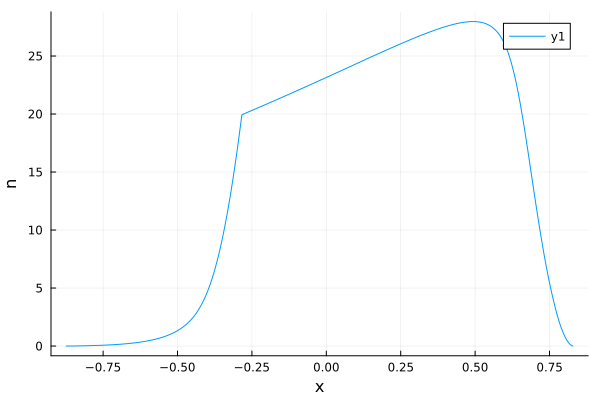

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz


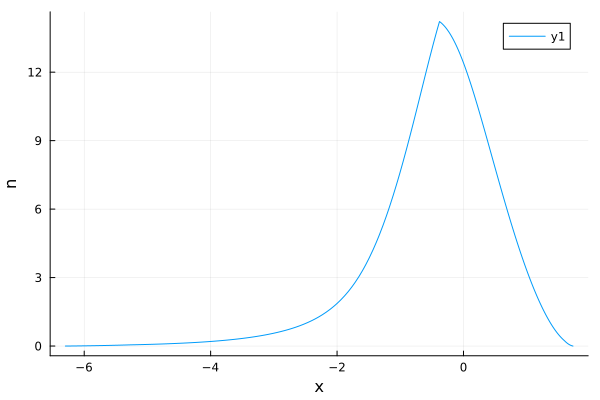

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz


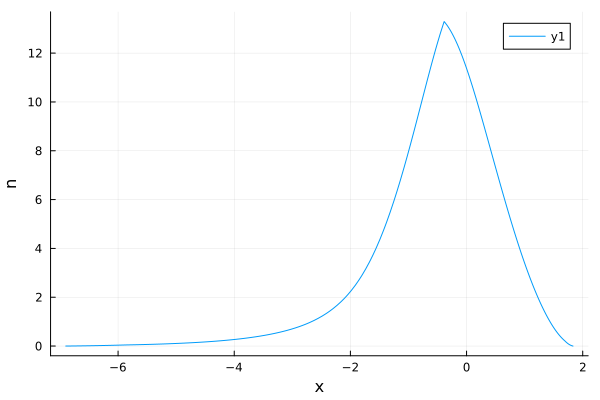

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz


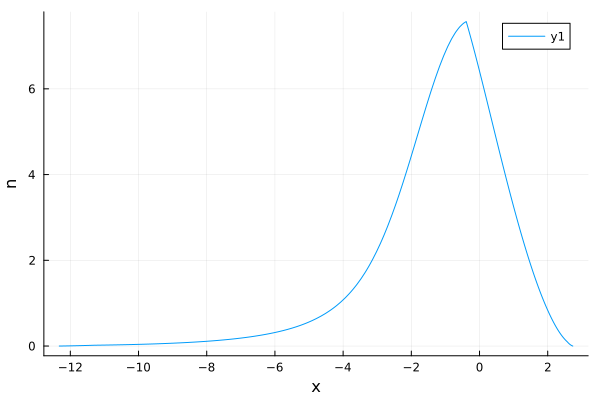

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz


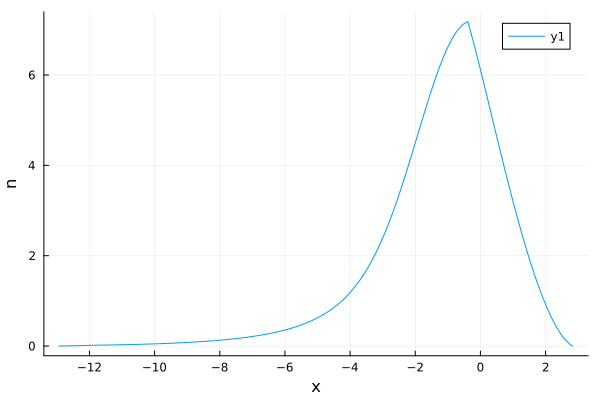

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz


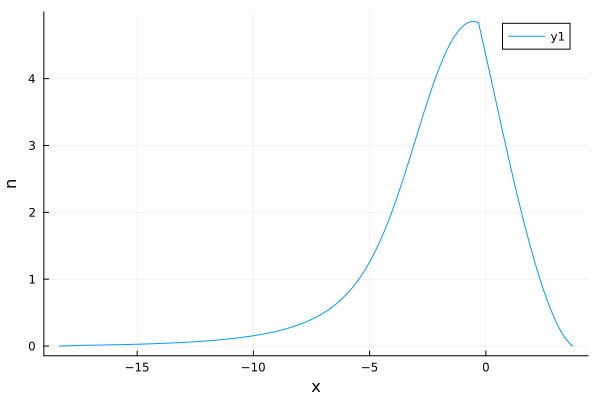

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz


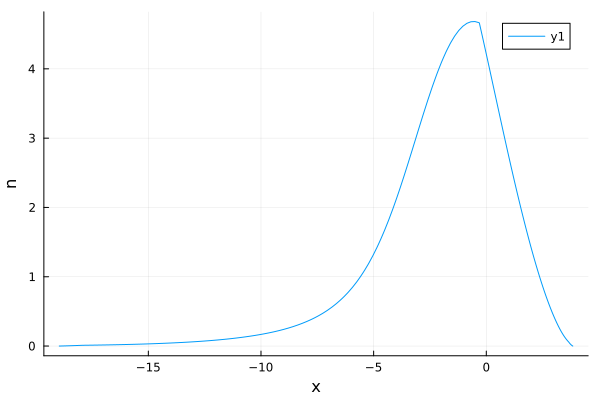

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz


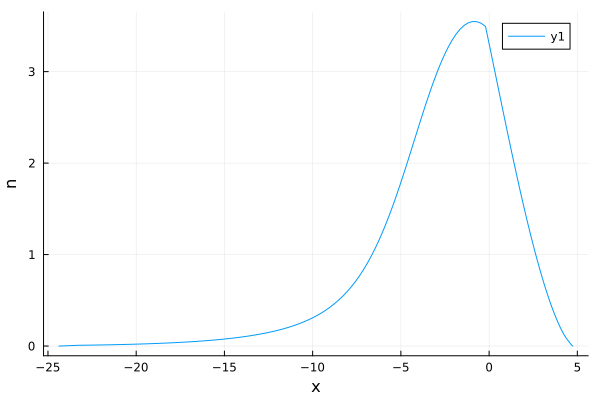

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz


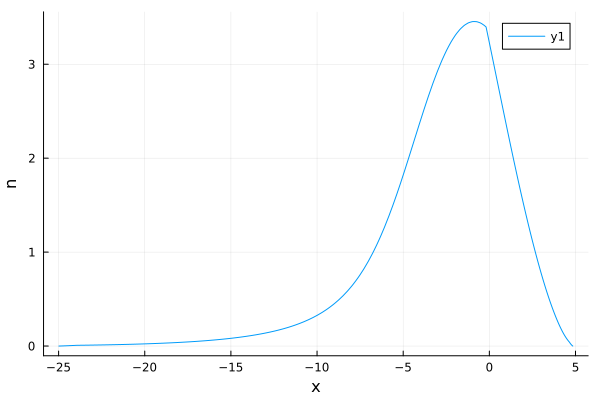

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz


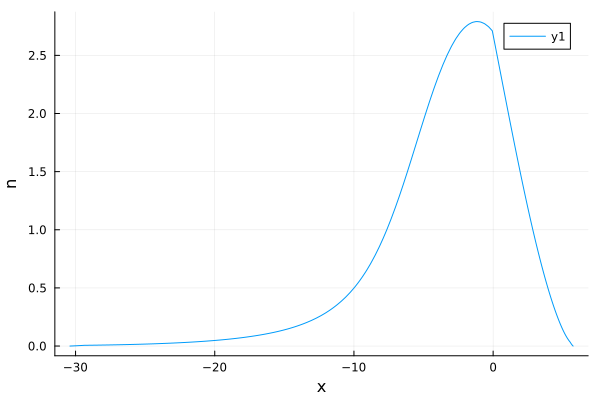

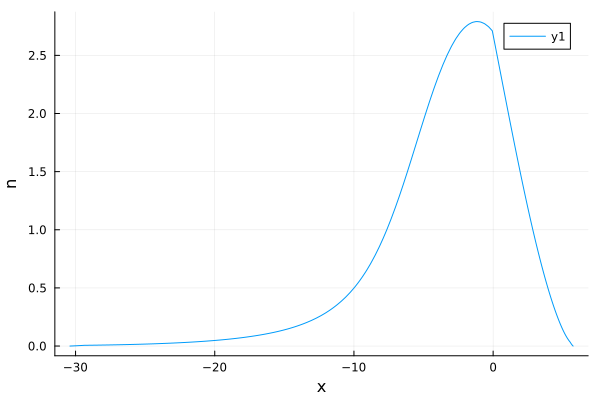

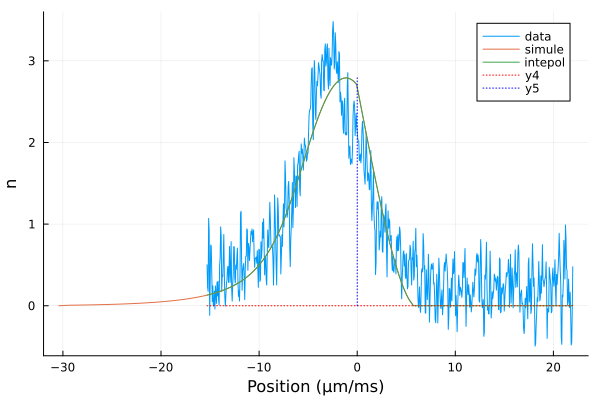

mu = 50.9459540905706
mu = 51.80040443152512
T = 613.3669187295022
n_p , model_mu(T , mu) 47.23000000000003
saved : 2024-02-09/theta_discr_ih1.npz
  0.016021 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih1_51.800_613.367.npz


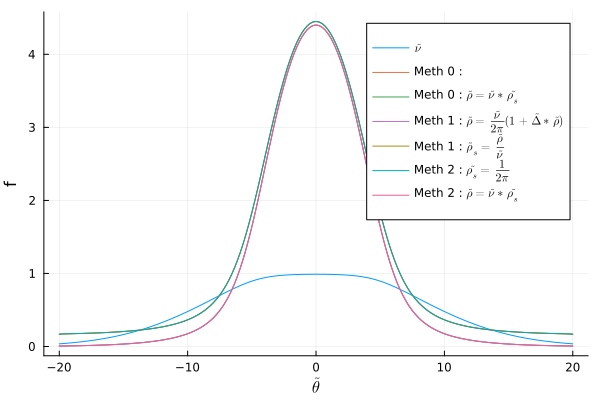

  0.003320 seconds (32 allocations: 1.840 MiB, 66.88% gc time)
saved : 2024-02-09/rho_s_discr_ih1_51.800_613.367.npz
  0.000005 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_51.800_613.367.npz
  0.001290 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_51.800_613.367.npz
saved : 2024-02-09/veff_bord_discr_ih1_51.800_613.367.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


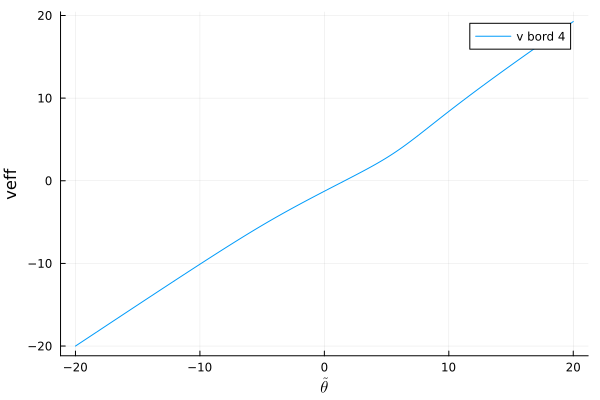

  0.408435 seconds (15.14 M allocations: 368.745 MiB, 8.55% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_51.800_613.367_7.586.npz
  0.000009 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
theta_star = 2.167 
  0.000906 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
  0.000006 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_51.800_613.367_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_51.800_613.367_7.586_33.187.npz


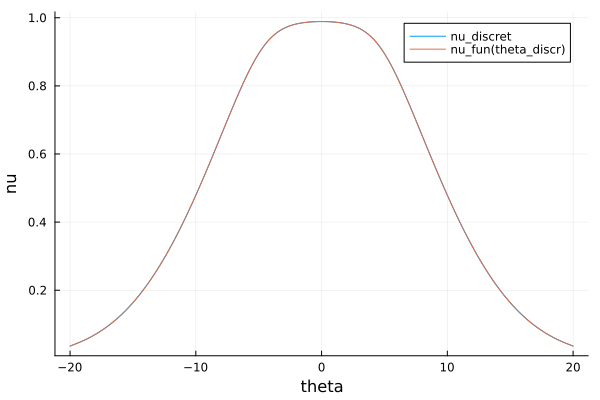

la densité haute est : 47.23000000000003
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.367_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_51.800_613.367_0.000.npz
la densité haute est : 47.23000000000003
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.367_veff_bord.npz


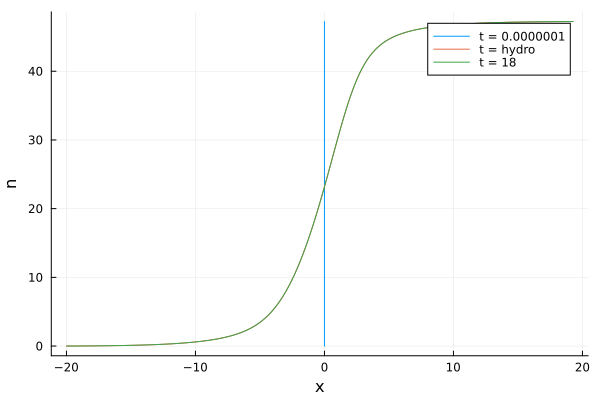

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.016068 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih2_51.800_613.367.npz


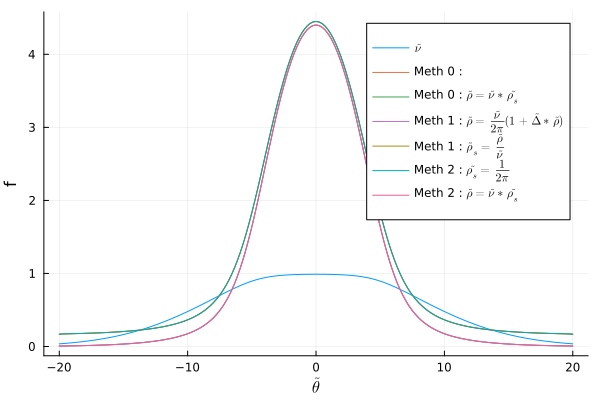

  0.000959 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_51.800_613.367.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_51.800_613.367.npz
  0.001297 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_51.800_613.367.npz
saved : 2024-02-09/veff_bord_discr_ih2_51.800_613.367.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


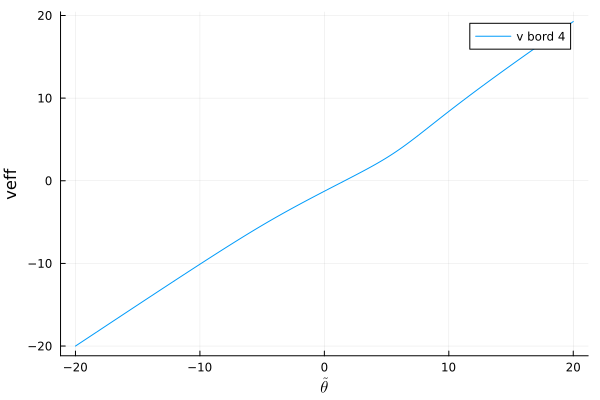

  0.402414 seconds (15.14 M allocations: 368.745 MiB, 7.63% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_51.800_613.367_7.586.npz
  0.000007 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
theta_star = 2.167 
  0.000896 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
  0.000006 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_51.800_613.367_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_51.800_613.367_7.586_33.187.npz


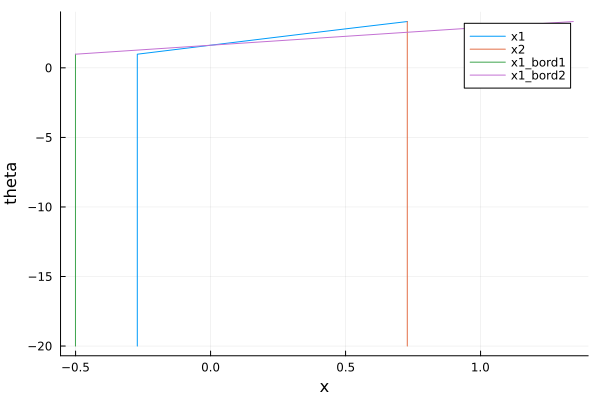

7.151817657798073e-25
lannnnn
lafffff


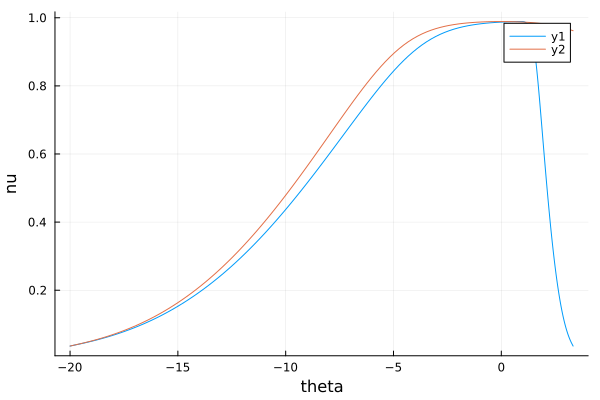

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_0.000.npz


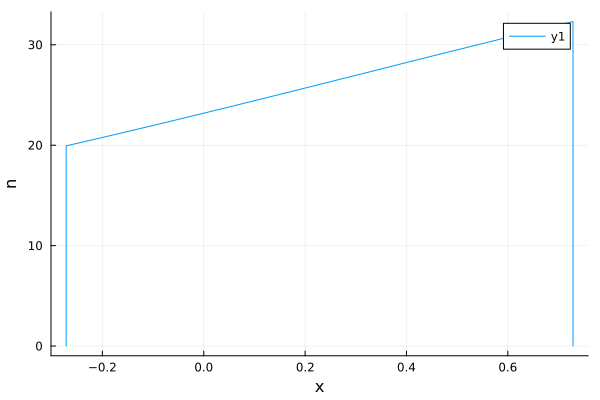

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_1.000.npz


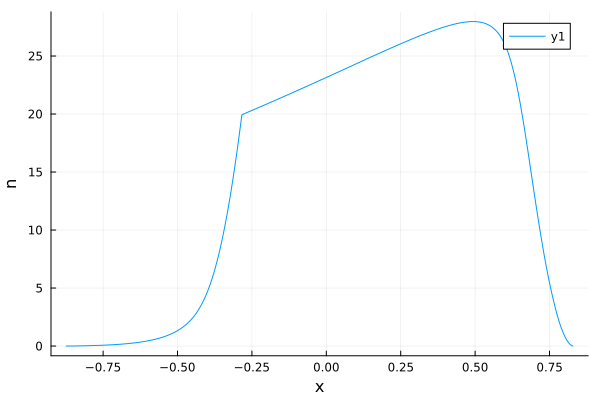

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_10.000.npz


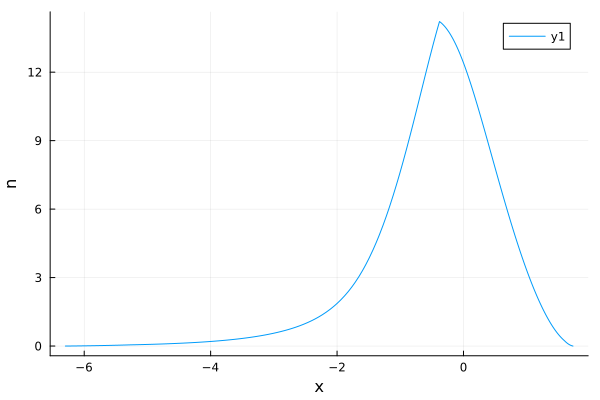

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_11.000.npz


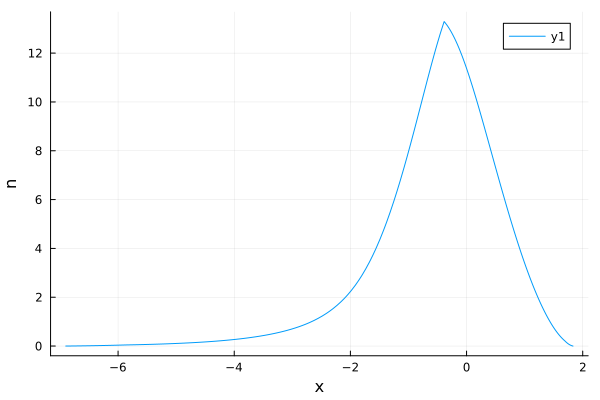

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_20.000.npz


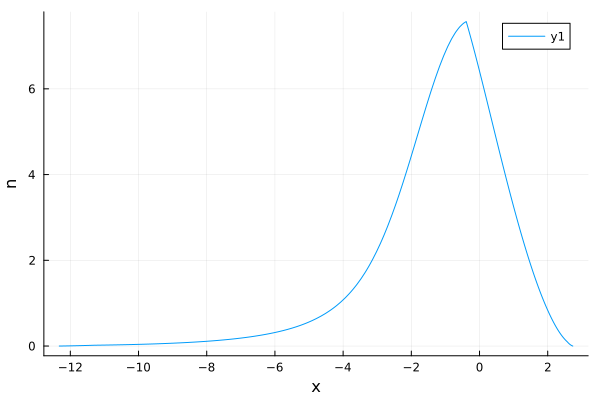

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_21.000.npz


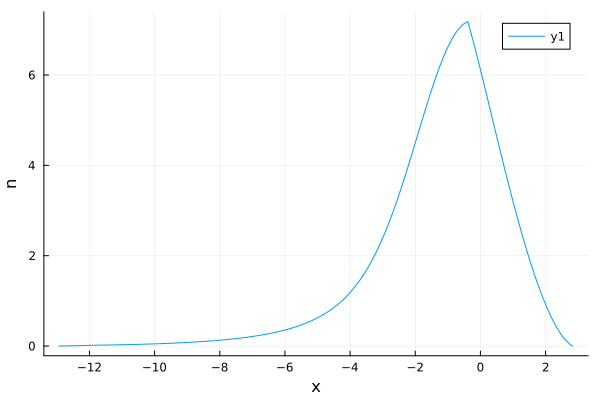

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_30.000.npz


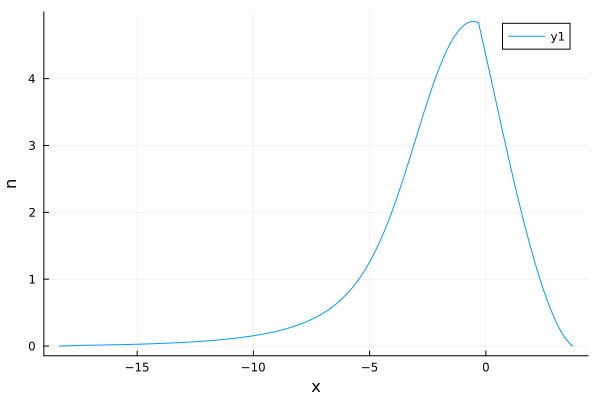

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_31.000.npz


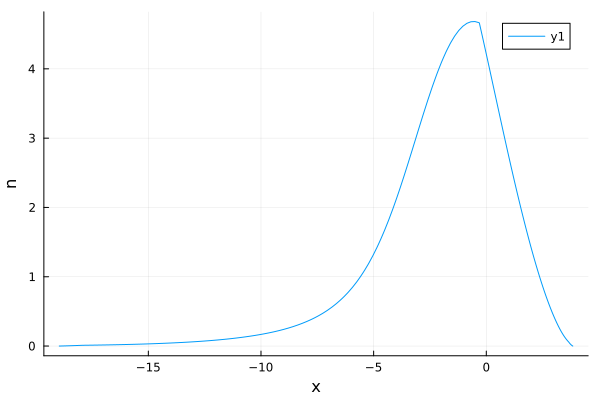

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_40.000.npz


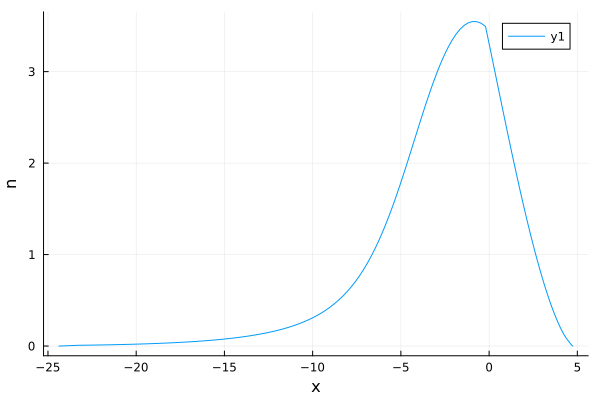

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_41.000.npz


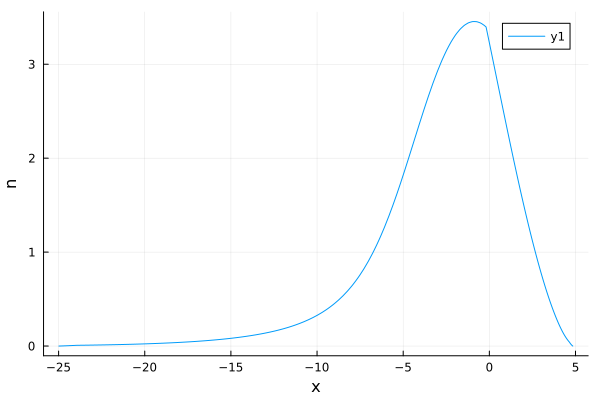

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.367_7.586_33.187_50.000.npz


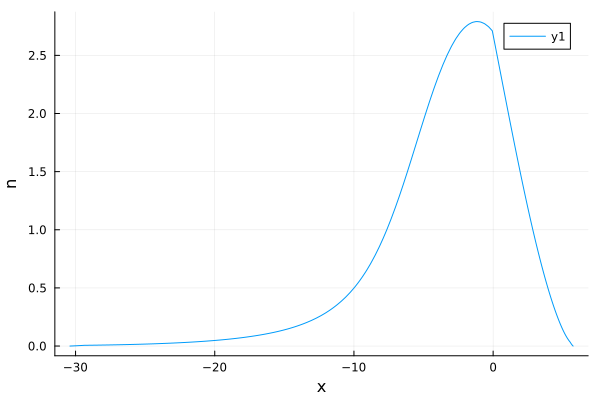

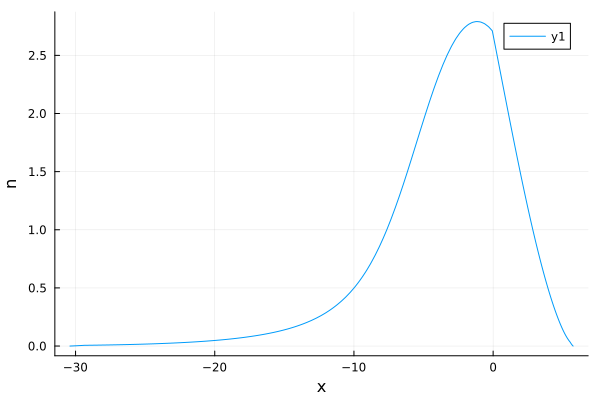

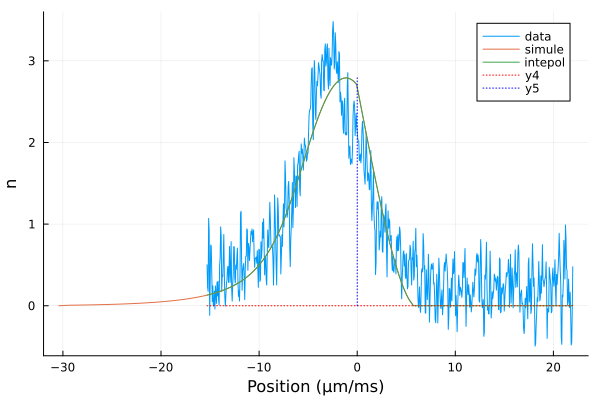

mu = 50.9459540905706
mu = 51.80030028704947
T = 613.3706329449412
n_p , model_mu(T , mu) 47.23000000000001
saved : 2024-02-09/theta_discr_ih1.npz
  0.016236 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih1_51.800_613.371.npz


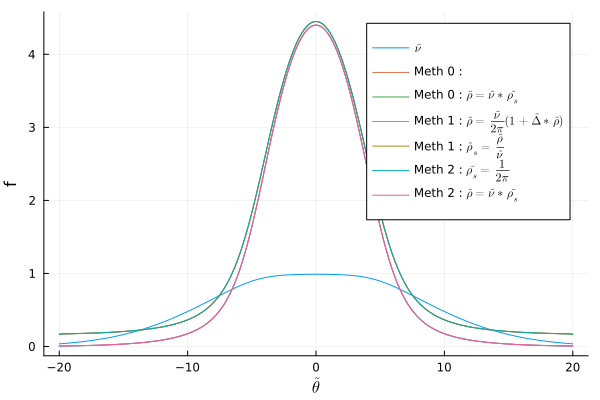

  0.001923 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_51.800_613.371.npz
  0.000007 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_51.800_613.371.npz
  0.001311 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_51.800_613.371.npz
saved : 2024-02-09/veff_bord_discr_ih1_51.800_613.371.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


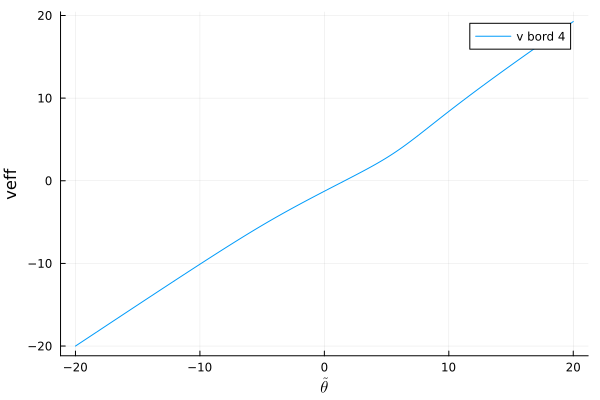

  0.646386 seconds (15.14 M allocations: 368.745 MiB, 6.31% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_51.800_613.371_7.586.npz
  0.000010 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_51.800_613.371_7.586.npz
theta_star = 2.167 
  0.001139 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_51.800_613.371_7.586.npz
  0.000007 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_51.800_613.371_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_51.800_613.371_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_51.800_613.371_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_51.800_613.371_7.586_33.187.npz


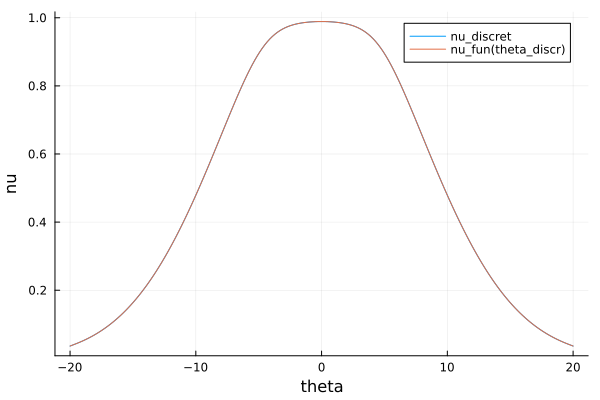

la densité haute est : 47.23000000000001
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.371_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_51.800_613.371_0.000.npz
la densité haute est : 47.23000000000001
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.800_613.371_veff_bord.npz


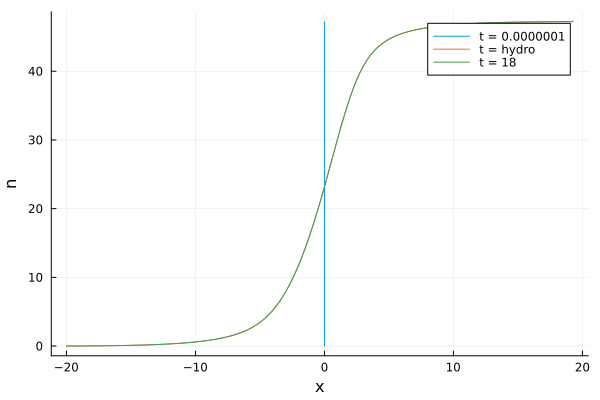

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.016183 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih2_51.800_613.371.npz


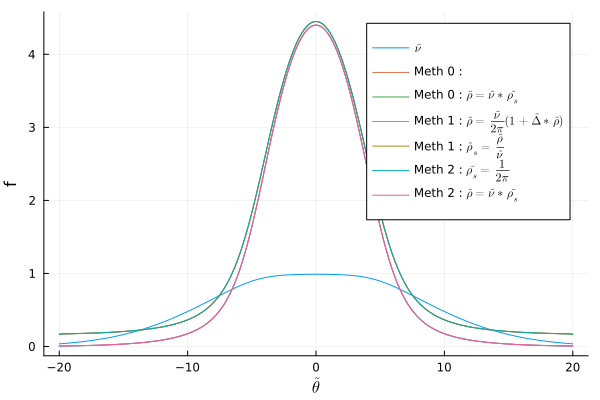

  0.001341 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_51.800_613.371.npz
  0.000009 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_51.800_613.371.npz
  0.001998 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_51.800_613.371.npz
saved : 2024-02-09/veff_bord_discr_ih2_51.800_613.371.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


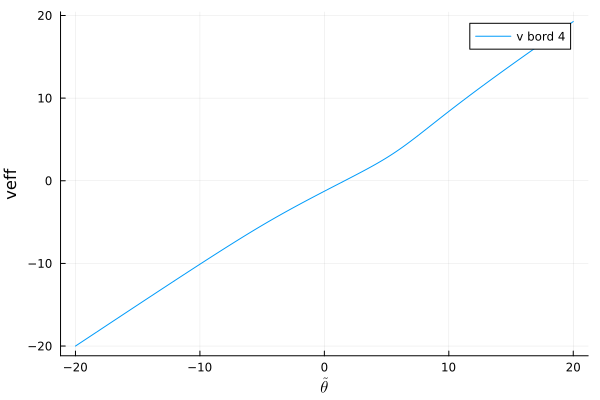

  0.649772 seconds (15.14 M allocations: 368.745 MiB, 6.97% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_51.800_613.371_7.586.npz
  0.000009 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_51.800_613.371_7.586.npz
theta_star = 2.167 
  0.001137 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_51.800_613.371_7.586.npz
  0.000004 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_51.800_613.371_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_51.800_613.371_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_51.800_613.371_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_51.800_613.371_7.586_33.187.npz


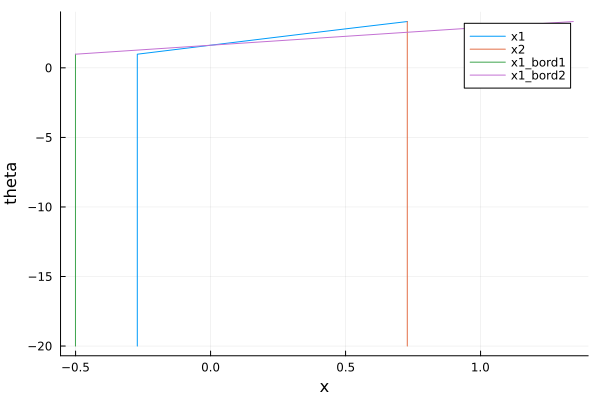

7.151803279101456e-25
lannnnn
lafffff


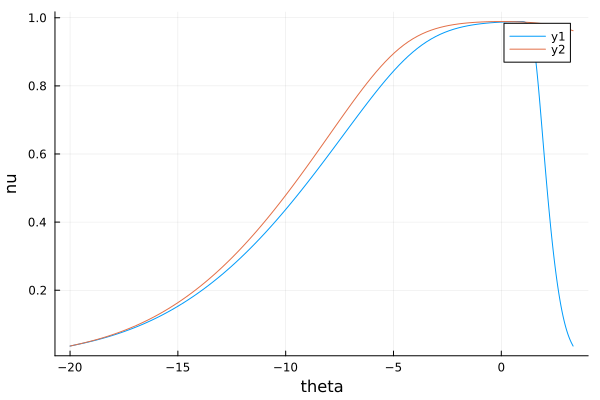

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_0.000.npz


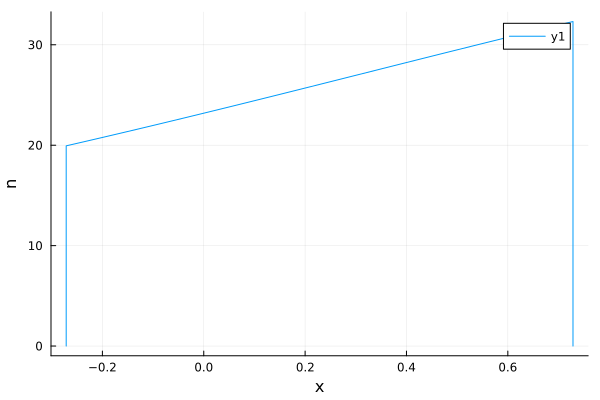

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_1.000.npz


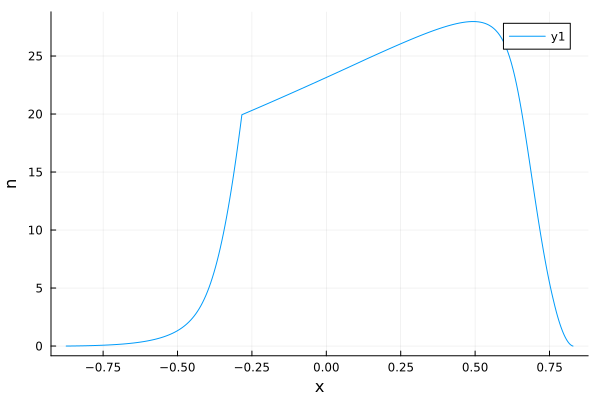

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_10.000.npz


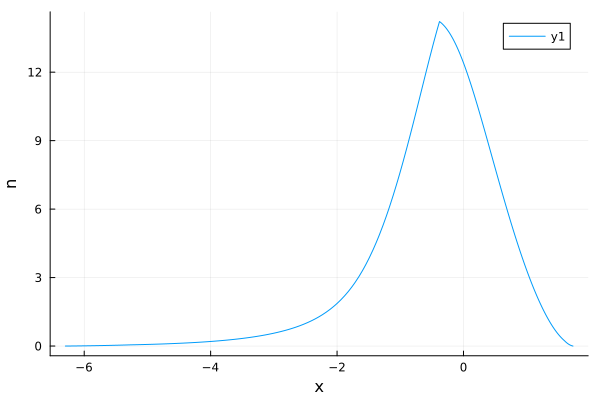

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_11.000.npz


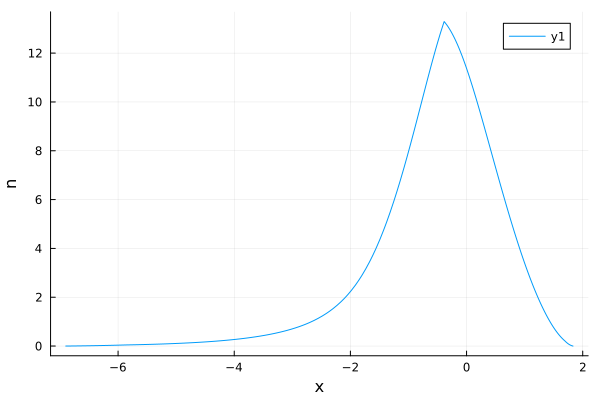

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_20.000.npz


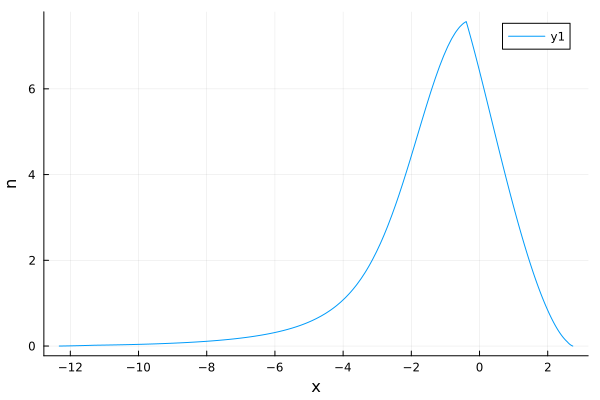

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_21.000.npz


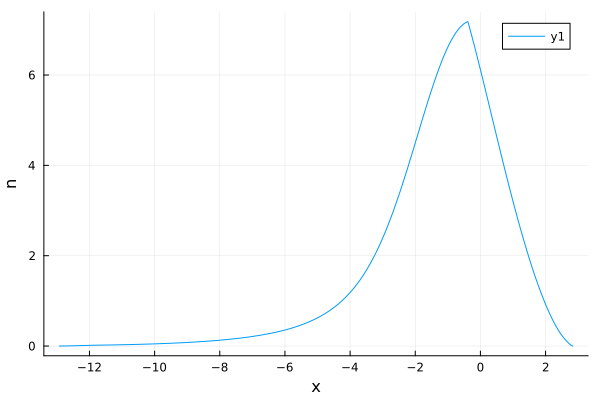

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_30.000.npz


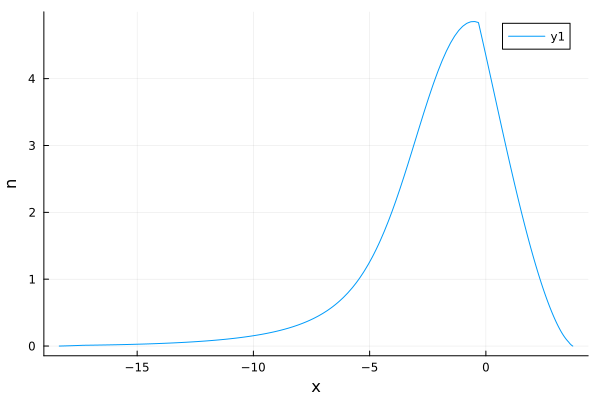

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_31.000.npz


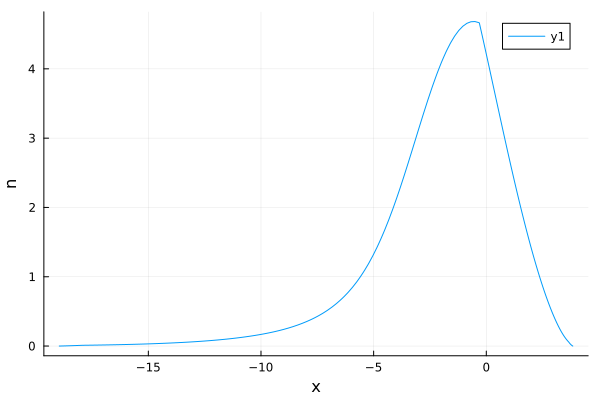

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_40.000.npz


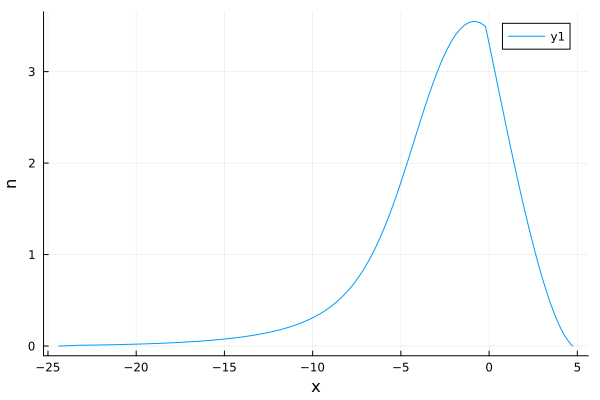

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_41.000.npz


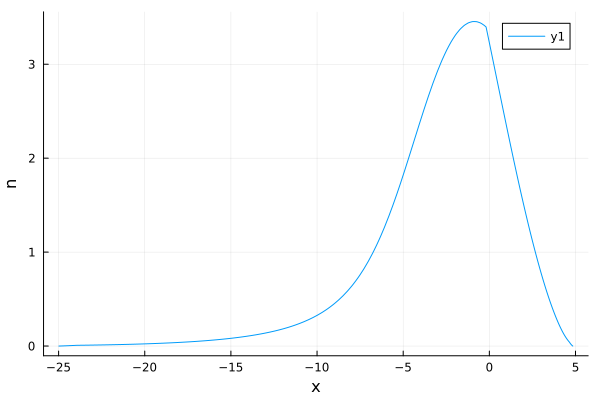

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.800_613.371_7.586_33.187_50.000.npz


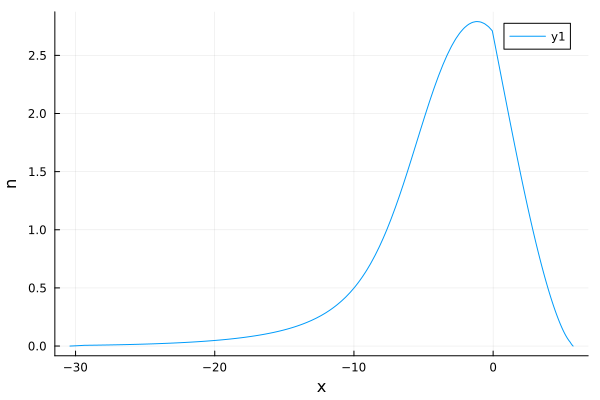

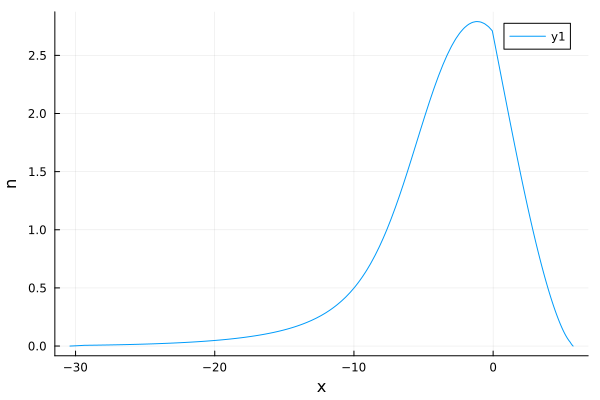

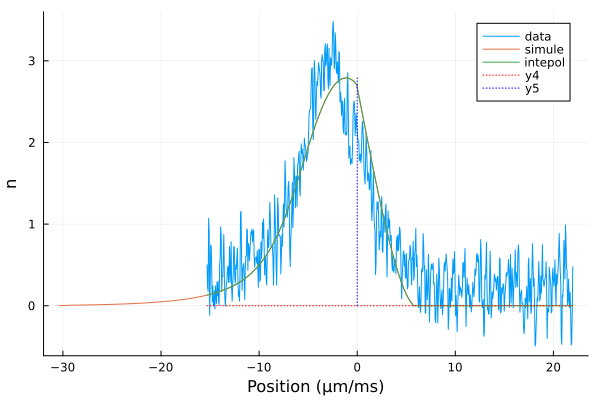

mu = 50.9459540905706
mu = 51.800508574850085
T = 613.3632045140632
n_p , model_mu(T , mu) 47.230000000000025
saved : 2024-02-09/theta_discr_ih1.npz
  0.018536 seconds (8.28 k allocations: 6.867 MiB, 11.58% gc time)
saved : 2024-02-09/nu_discr_ih1_51.801_613.363.npz


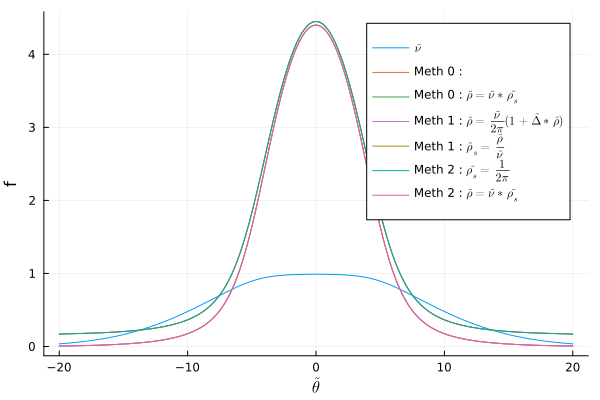

  0.000981 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_51.801_613.363.npz
  0.000008 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_51.801_613.363.npz
  0.001284 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_51.801_613.363.npz
saved : 2024-02-09/veff_bord_discr_ih1_51.801_613.363.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


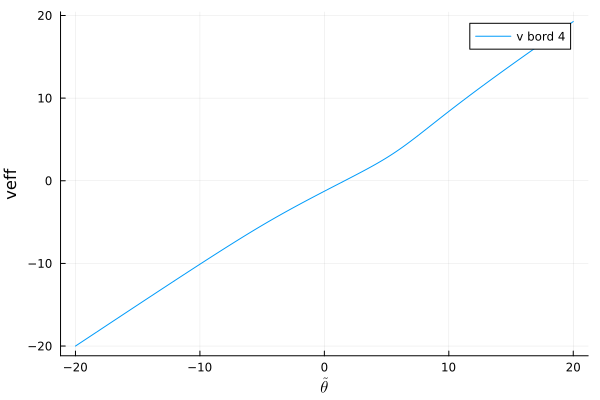

  0.659319 seconds (15.14 M allocations: 368.745 MiB, 6.20% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_51.801_613.363_7.586.npz
  0.000013 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_51.801_613.363_7.586.npz
theta_star = 2.167 
  0.001139 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_51.801_613.363_7.586.npz
  0.000007 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_51.801_613.363_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_51.801_613.363_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_51.801_613.363_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_51.801_613.363_7.586_33.187.npz


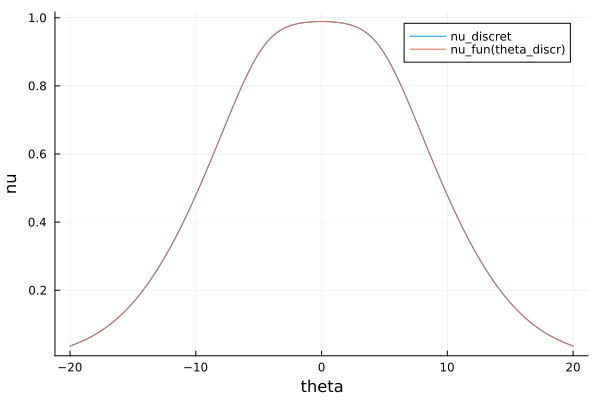

la densité haute est : 47.230000000000025
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.801_613.363_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_51.801_613.363_0.000.npz
la densité haute est : 47.230000000000025
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_51.801_613.363_veff_bord.npz


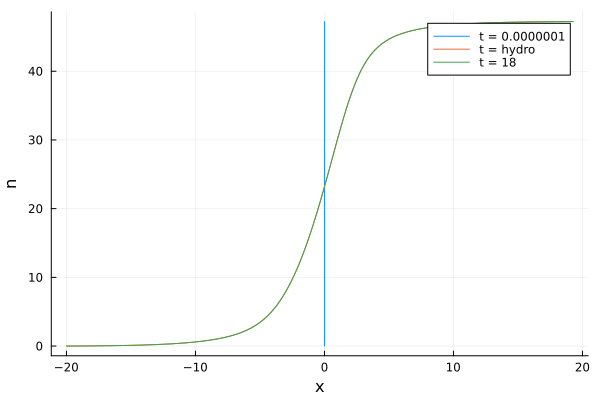

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.018364 seconds (8.28 k allocations: 6.867 MiB)
saved : 2024-02-09/nu_discr_ih2_51.801_613.363.npz


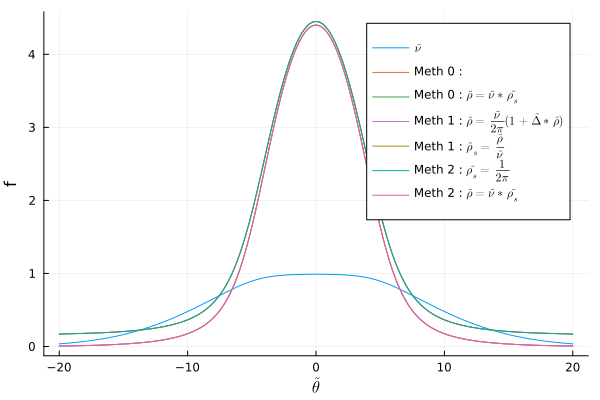

  0.001460 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_51.801_613.363.npz
  0.000016 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_51.801_613.363.npz
  0.001978 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_51.801_613.363.npz
saved : 2024-02-09/veff_bord_discr_ih2_51.801_613.363.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


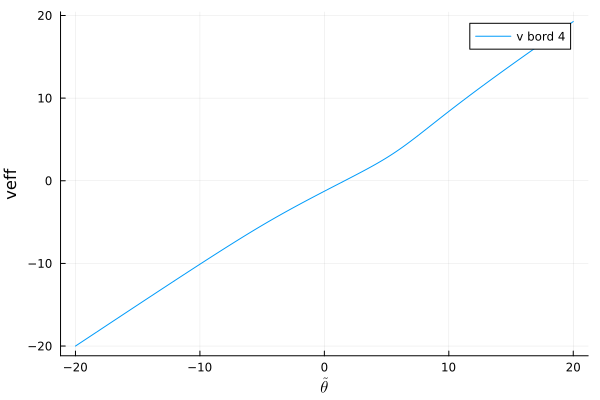

  0.410932 seconds (15.14 M allocations: 368.745 MiB, 9.42% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_51.801_613.363_7.586.npz
  0.000007 seconds (116 allocations: 5.031 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_51.801_613.363_7.586.npz
theta_star = 2.167 
  0.000897 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_51.801_613.363_7.586.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_51.801_613.363_7.586.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_51.801_613.363_7.586_33.187.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_51.801_613.363_7.586_33.187.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_51.801_613.363_7.586_33.187.npz


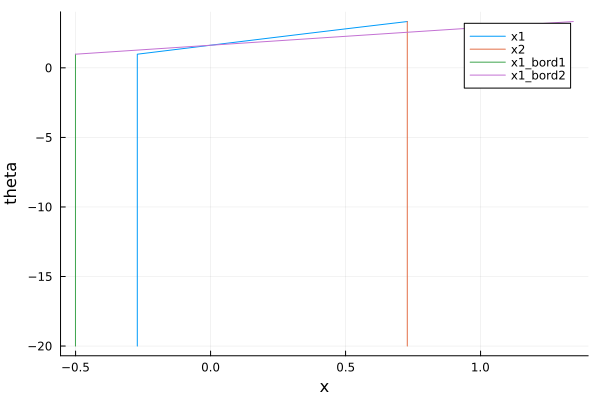

7.151832036335819e-25
lannnnn
lafffff


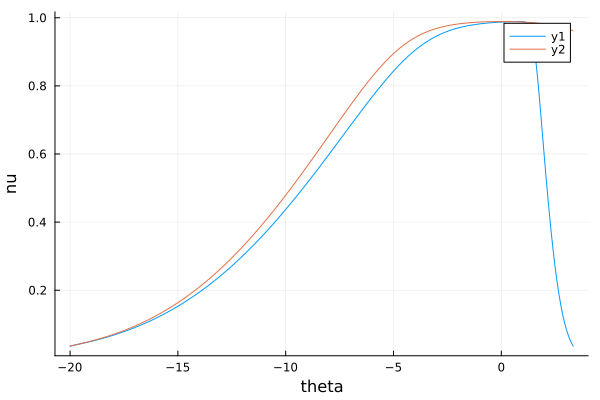

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_0.000.npz


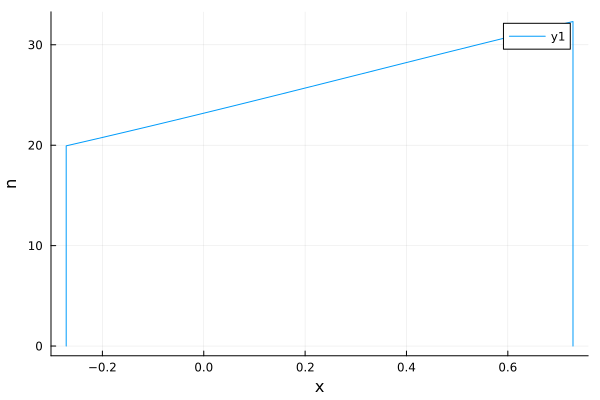

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_51.801_613.363_7.586_33.187_1.000.npz


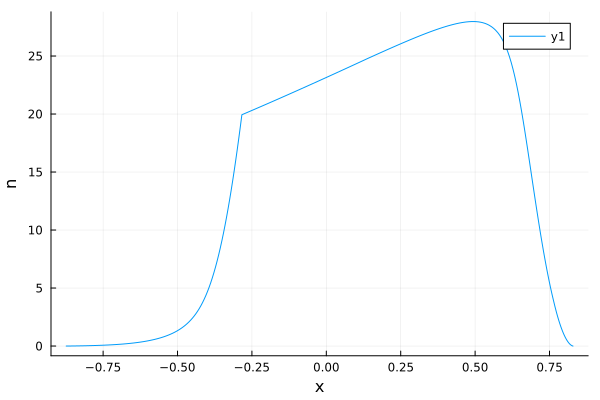

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved


LoadError: InterruptException:

In [62]:
n_p = 47.23
Taille = 33.18730163574219#22.176#22.140228271484375#27.866241455078125#23.818206787109375#24.780000000000086  #mu m 
x0 = 7.585657087466846#18.339047468776954#18.856991739272907

fit_deformation = 0 == 1 
fit_expension = 1 == 1

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Formater la date selon le format spécifié
#new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
# Creer  le dossier
#new_date = "2024-"
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 47.23
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    println("mu = ", mu)
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu) ", model_mu(T*ones(1) , mu*ones(1))[1])
    mup = mu*kB
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)


    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, x0, Taille, gbar , mode , "None" ,"None")    

    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="Position (μm/ms)", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    # Tracer une ligne horizontale en pointillé (par exemple, à y = 0)
    plot!(p, [minimum(x), maximum(x)], [0, 0],  linestyle = :dot, color = :red)

    # Tracer une ligne verticale en pointillé (par exemple, à x = 0)
    plot!(p, [0, 0], [minimum(densi), maximum(densi)],  linestyle = :dot, color = :blue)

    display(p)
    return densi
end 
#Pkg.add("LsqFit")    
using LsqFit


# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 600*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




mu = 50.9459540905706
mu = 56.06373279533631
T = 325.0882112657968
n_p , model_mu(T , mu)47.230000000000025
saved : 2024-02-09/theta_discr_ih1.npz
  0.015221 seconds (10.00 k allocations: 8.238 MiB)
saved : 2024-02-09/nu_discr_ih1_56.064_325.088.npz


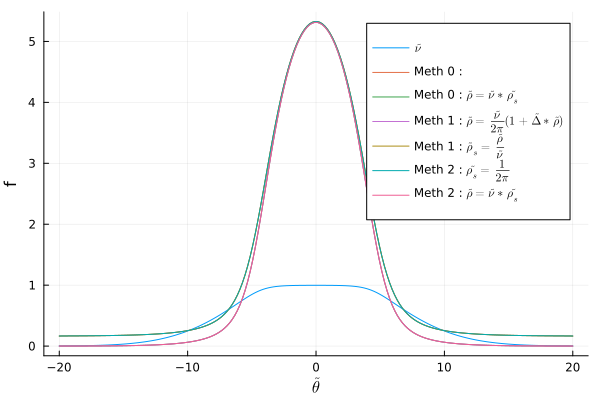

  0.001078 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih1_56.064_325.088.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih1_56.064_325.088.npz
  0.001543 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih1_56.064_325.088.npz
saved : 2024-02-09/veff_bord_discr_ih1_56.064_325.088.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


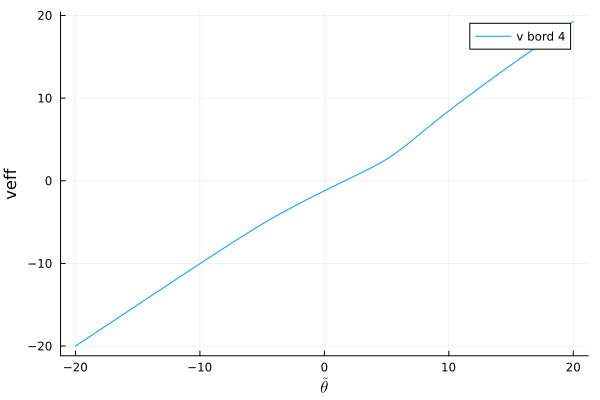

  0.405097 seconds (15.14 M allocations: 368.743 MiB, 9.96% gc time)
saved : 2024-02-09/theta_edge_1.0_ih1_56.064_325.088_5.373.npz
  0.000005 seconds (115 allocations: 5.016 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih1_56.064_325.088_5.373.npz
theta_star = 2.060 
  0.000951 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih1_56.064_325.088_5.373.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih1_56.064_325.088_5.373.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih1_56.064_325.088_5.373_42.480.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih1_56.064_325.088_5.373_42.480.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih1_56.064_325.088_5.373_42.480.npz


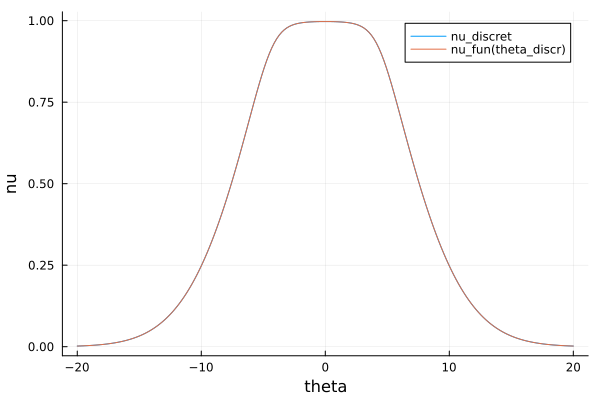

la densité haute est : 47.230000000000025
t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_56.064_325.088_0.000.npz
saved : 2024-02-09/bord_theta_edge_1.0_ih1_56.064_325.088_0.000.npz
la densité haute est : 47.230000000000025
t = veff_bord saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih1_56.064_325.088_veff_bord.npz


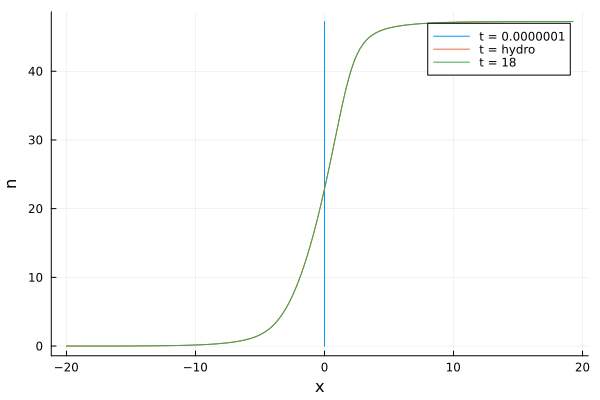

ih2
saveeeeeeeee
saved : 2024-02-09/theta_discr_ih2.npz
  0.015410 seconds (10.00 k allocations: 8.238 MiB)
saved : 2024-02-09/nu_discr_ih2_56.064_325.088.npz


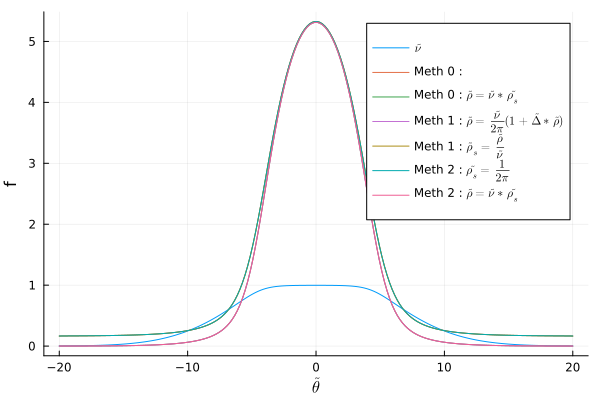

  0.001088 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_discr_ih2_56.064_325.088.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_discr_ih2_56.064_325.088.npz
  0.001539 seconds (37 allocations: 2.148 MiB)
saved : 2024-02-09/veff_discr_ih2_56.064_325.088.npz
saved : 2024-02-09/veff_bord_discr_ih2_56.064_325.088.npz


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


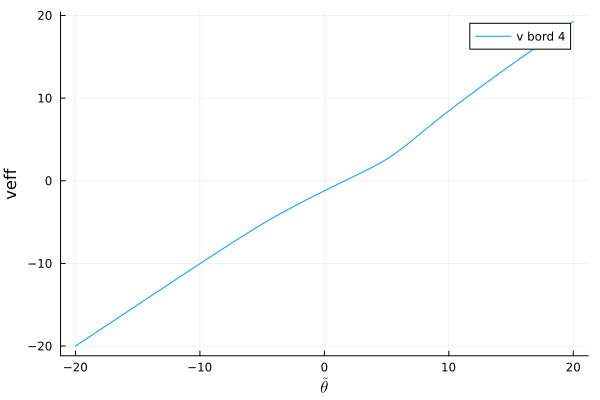

  0.411421 seconds (15.14 M allocations: 368.743 MiB, 11.42% gc time)
saved : 2024-02-09/theta_edge_1.0_ih2_56.064_325.088_5.373.npz
  0.000005 seconds (115 allocations: 5.016 KiB)
saved : 2024-02-09/nu_theta_edge_1.0_discr_ih2_56.064_325.088_5.373.npz
theta_star = 2.060 
  0.000962 seconds (32 allocations: 1.840 MiB)
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_ih2_56.064_325.088_5.373.npz
  0.000003 seconds (3 allocations: 1.656 KiB)
saved : 2024-02-09/rho_theta_edge_1.0_discr_ih2_56.064_325.088_5.373.npz
moyenn
saved : 2024-02-09/nu_theta_edge_1.0_discr_moy_ih2_56.064_325.088_5.373_42.480.npz
saved : 2024-02-09/rho_s_theta_edge_1.0_discr_moy_ih2_56.064_325.088_5.373_42.480.npz
saved : 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_56.064_325.088_5.373_42.480.npz


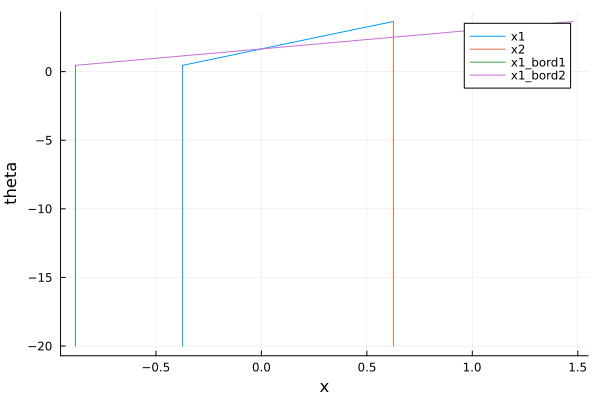

7.740433662014827e-25
lannnnn
lafffff


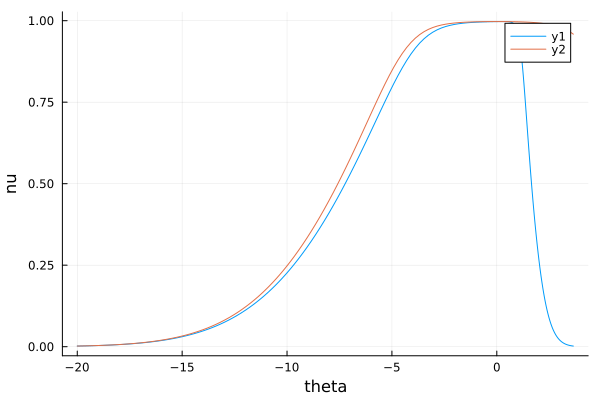

t = 0.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_0.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_0.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_0.000.npz


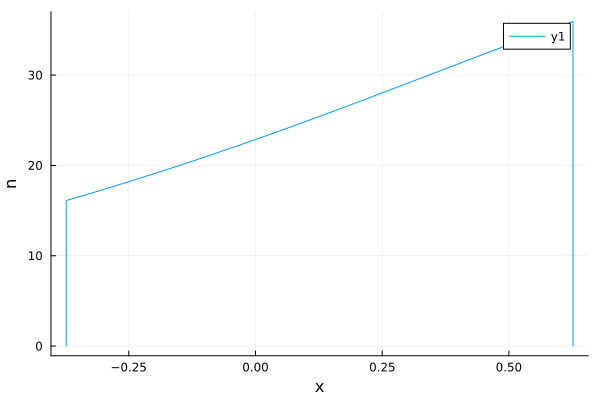

t = 0.000 
t = 1.000 saved
t = 1.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_1.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_1.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_1.000.npz


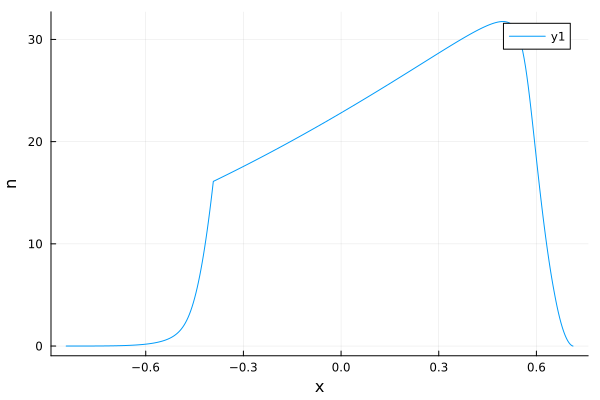

t = 2.000 saved
t = 3.000 saved
t = 4.000 saved
t = 5.000 saved
t = 6.000 saved
t = 7.000 saved
t = 8.000 saved
t = 9.000 saved
t = 10.000 saved
t = 10.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_10.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_10.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_10.000.npz


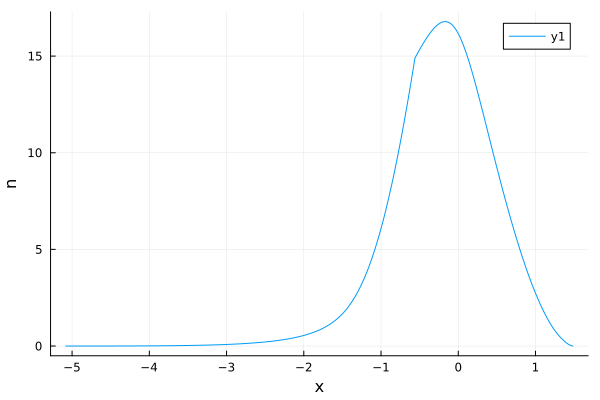

t = 11.000 saved
t = 11.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_11.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_11.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_11.000.npz


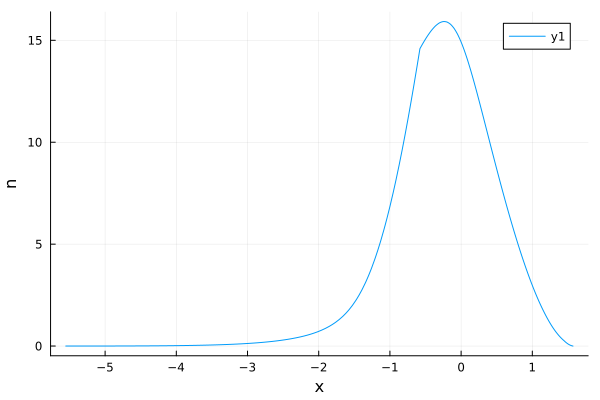

t = 12.000 saved
t = 13.000 saved
t = 14.000 saved
t = 15.000 saved
t = 16.000 saved
t = 17.000 saved
t = 18.000 saved
t = 19.000 saved
t = 20.000 saved
t = 20.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_20.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_20.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_20.000.npz


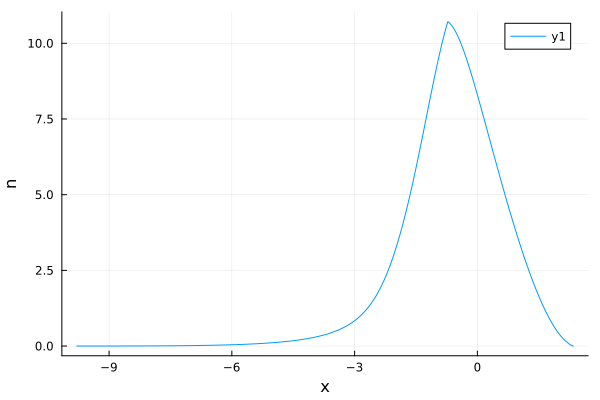

t = 21.000 saved
t = 21.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_21.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_21.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_21.000.npz


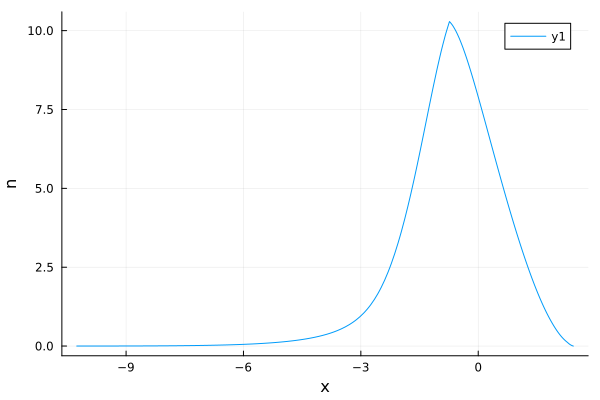

t = 22.000 saved
t = 23.000 saved
t = 24.000 saved
t = 25.000 saved
t = 26.000 saved
t = 27.000 saved
t = 28.000 saved
t = 29.000 saved
t = 30.000 saved
t = 30.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_30.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_30.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_30.000.npz


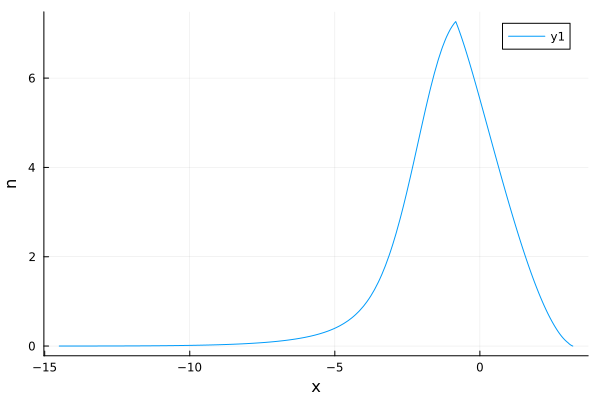

t = 31.000 saved
t = 31.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_31.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_31.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_31.000.npz


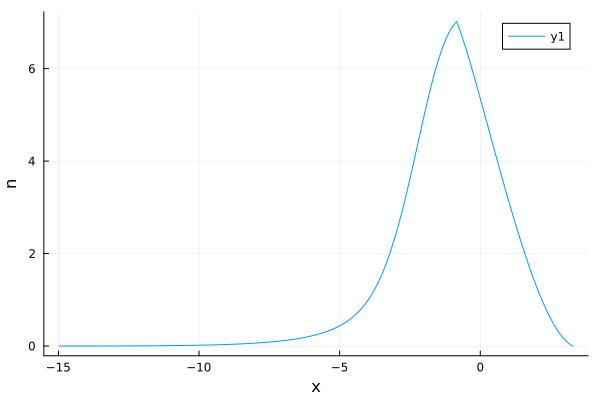

t = 32.000 saved
t = 33.000 saved
t = 34.000 saved
t = 35.000 saved
t = 36.000 saved
t = 37.000 saved
t = 38.000 saved
t = 39.000 saved
t = 40.000 saved
t = 40.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_40.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_40.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_40.000.npz


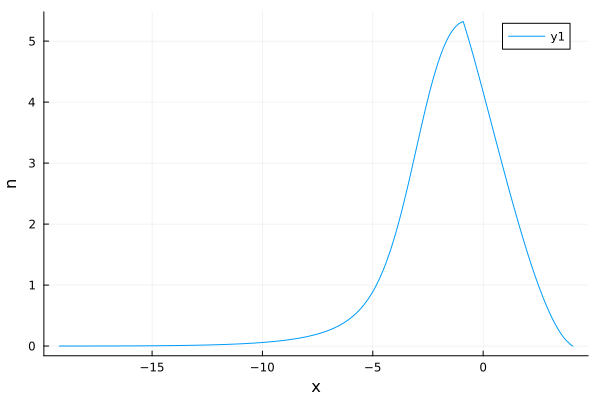

t = 41.000 saved
t = 41.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_41.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_41.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_41.000.npz


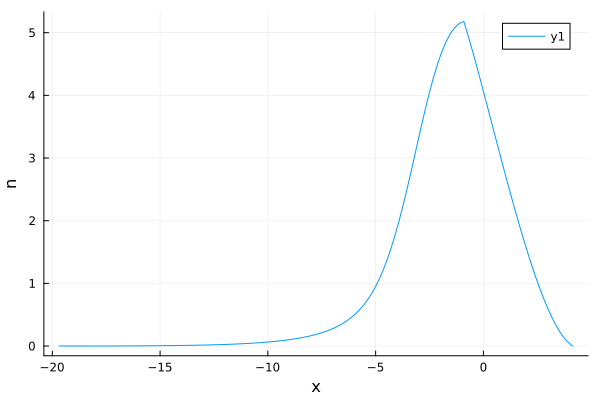

t = 42.000 saved
t = 43.000 saved
t = 44.000 saved
t = 45.000 saved
t = 46.000 saved
t = 47.000 saved
t = 48.000 saved
t = 49.000 saved
t = 50.000 saved
t = 50.000 saved
saved : 2024-02-09/density_expansion_nu_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_50.000.npz
saved : 2024-02-09/bord1_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_50.000.npz
saved : 2024-02-09/bord2_theta_edge_1.0_ih2_56.064_325.088_5.373_42.480_50.000.npz


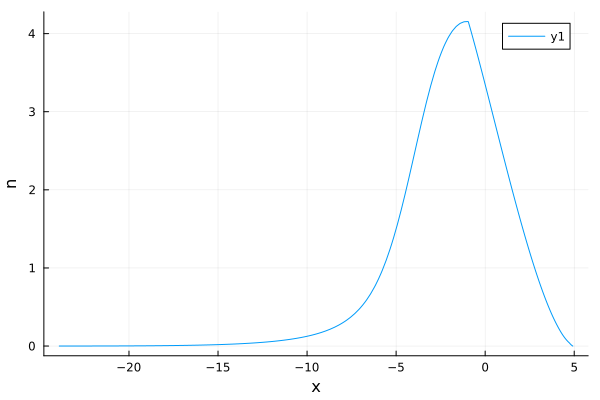

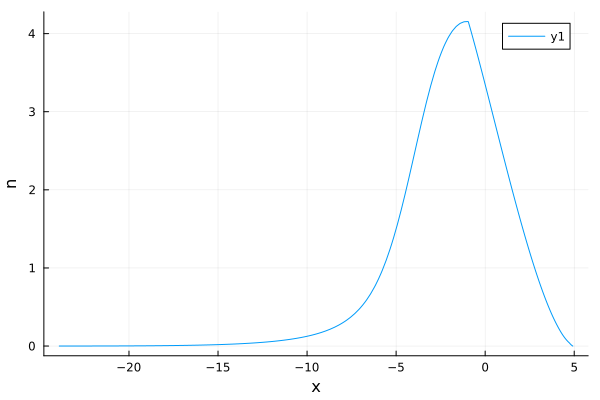

([-23.914007674350692, -23.67086215672938, -23.427734260332052, -23.18459715282519, -22.941457067274758, -22.886654340902137, -22.698316664252715, -22.64289233844069, -22.455176066314902, -22.399098736373052  …  4.68339430502118, 4.7153338539019325, 4.731066488668924, 4.747345245725908, 4.779811774406875, 4.8129823918985295, 4.847144594447783, 4.882630061940158, 4.919719124191222, 4.919719124191237], [0.0, 9.414692046366886e-5, 0.00020163654850155767, 0.00032412529687569057, 0.000463496070015356, 0.0004974549117429967, 0.0005501061718526517, 0.0005665717342228599, 0.0006256615064477341, 0.0006444193862841778  …  0.04986654998244155, 0.04306040966419613, 0.03985400389767597, 0.035233640219466296, 0.026727357511401973, 0.018978602864720404, 0.011969226519768672, 0.005662517261421743, 2.590658449408936e-15, 0.0])

In [59]:
#T = 1256.101#coef(fit)[1] 
#T = coef(fit)[1] 
#Taille = 22.176#22.140228271484375#27.866241455078125#23.818206787109375#24.780000000000086  #mu m 
#x0 = 18.339047468776954#18.856991739272907

mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
println("mu = ", mu)
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 1 == 0 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]



println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
n_p = "None"
theta_discr = LinRange(-theta_max, theta_max, npts)


x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup,  T, x0, Taille, gbar , mode , "None" , "None")

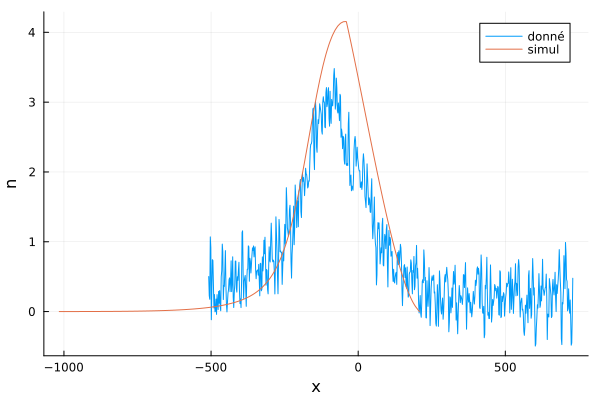

In [60]:
x_data = DONNEES[4][1] 
y_data = DONNEES[4][2]

p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data , label = "donné")
plot!(p, x_simul * Taille, y_simul, label = "simul")
display(p)

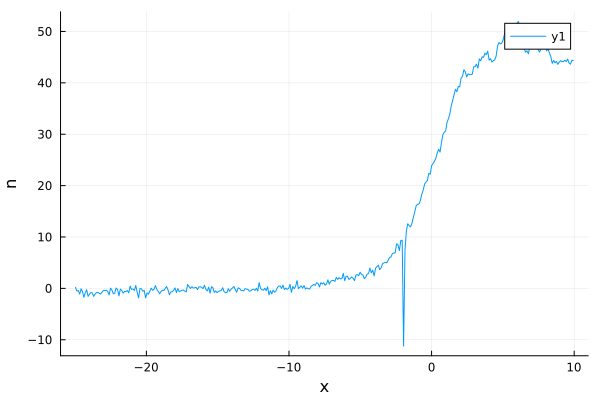

size x dat :(356,)
size(p0) : (3,)


LoadError: BoundsError: attempt to access 3-element Vector{Float64} at index [0]

In [52]:
Taille = 24.780000000000086  #mu m 

fit_deformation = 1 == 1 
fit_expension = 0 == 1 # on ne peux pas Tailles est un paramentre , doit faire varier les parametre à deux paramatre peux etre

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end


function model_fit_inhomo_trois(x, p)
    mup , T , Taille = p[1]*kB , p[2] , p[3]  
    n_p = "None"
    Taille = 24.780000000000086  #mu m On fix car complique de le faire varier
    println("mu = ", mup/kB)
    println("T = ", T)  
    println("Taille = ", Taille)
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]    
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, x0, Taille, gbar , mode , "None" ,"None")    
 
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = [55 , 910.0 , 59] 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0
upper_bounds = 1.5 .* p0
lower_bounds[3] = p0[0] - 0.1
upper_bounds[3] = p0[0] + 0.1


# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_trois, x_data, y_data , p0 ,  lower_bounds , upper_bounds)    